Import training and testing data for the rating head task.

{train, test}\_images: contains the path of each image
{train, test}\_scores: contains the user ratings of each image


In [1]:
import tensorflow as tf
import csv

data_folder = '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/'

train_data_path = data_folder + 'train_means_list.csv'
test_data_path = data_folder + 'test_list.csv'
images_path = data_folder + 'resized'

def get_scores(scores_path):

    images = []
    scores = []

    with open(scores_path) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        line_count = 0

        for row in csv_reader:
            if line_count == 0:

                line_count += 1
            else:

                scores.append(float(row[1]))
                line_count += 1
                image_name = row[0]

                images.append(images_path + image_name)

    return (images, scores)

train_images, train_scores = get_scores(train_data_path)
test_images, test_scores = get_scores(test_data_path)

2024-08-31 12:16:19.246997: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-31 12:16:19.247024: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-31 12:16:19.248108: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-31 12:16:19.253908: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-31 12:16:19.874337: W tensorflow/compiler/tf2

Shuffle the training set


In [2]:
import random
import numpy as np
import os

seed_value = 400

random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)

os.environ['TF_DETERMINISTIC_OPS'] = '1'

temp = list(zip(train_images, train_scores))
random.shuffle(temp)

train_images, train_scores = zip(*temp)


Display the first 3 images to make sure everything is ok.


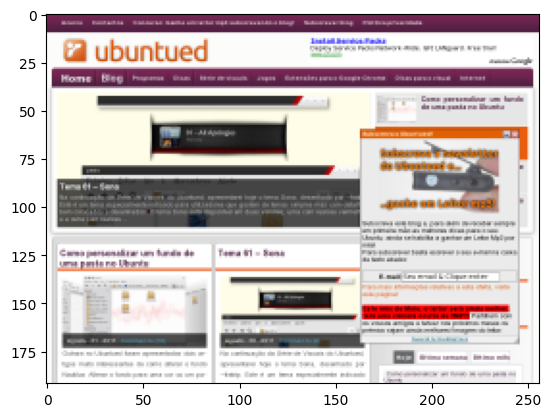

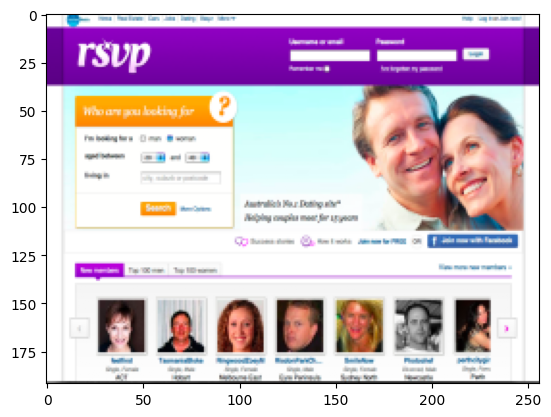

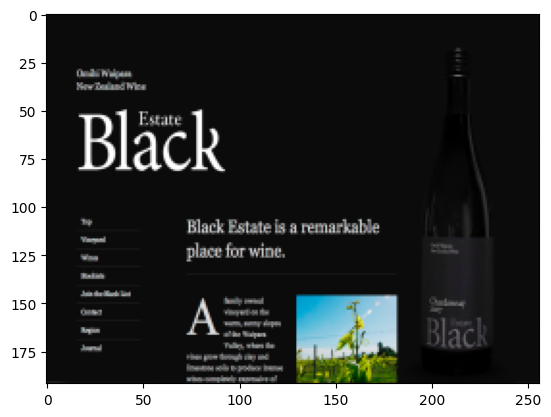

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

import matplotlib.image as mping
for ima in train_images[0:3]:
  img = mping.imread(ima)
  imgplot = plt.imshow(img)
  plt.show()

Read the images as numpy arrays


In [4]:
import cv2

width = 256
height = 192
channels = 3

def read_and_process_images(list_of_images):
  X = []

  for image in list_of_images:

    # images are already resized
    # X.append(cv2.resize(cv2.imread(image, cv2.IMREAD_COLOR), (width, height),
    #                     interpolation=cv2.INTER_AREA))

    X.append(cv2.imread(image, cv2.IMREAD_COLOR))

  return X


X_train = np.array(read_and_process_images(train_images))
y_train = np.array(train_scores)

X_val = np.array(read_and_process_images(test_images))
y_val = np.array(test_scores)

Display the first 3 images to make sure everything is ok


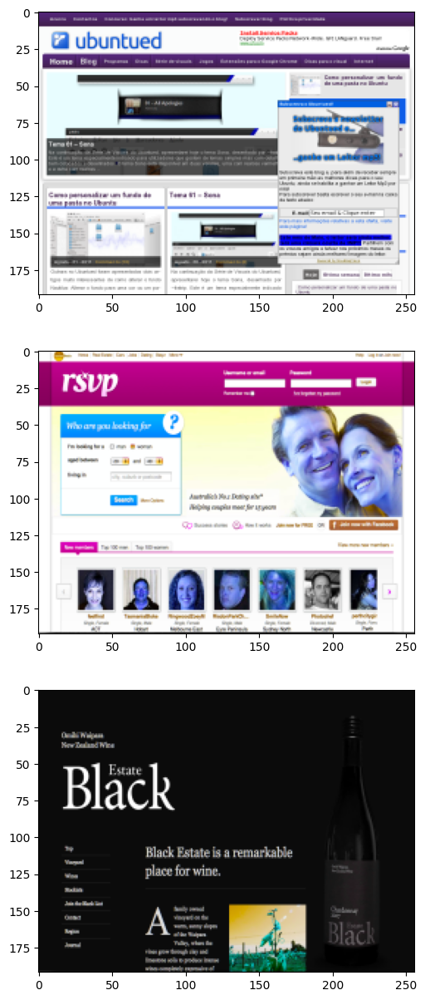

In [5]:
plt.figure(figsize=(25,15))
columns = 3

for i in range(columns):
  plt.subplot(columns, 1, i+1)
  plt.imshow(X_train[i])

Display shapes to check everything is ok


In [6]:
ntrain = len(X_train)
nval = len(X_val)

print('Shape of rating_X_train is: ', X_train.shape)
print('Shape of rating_X_val is: ', X_val.shape)
print('Shape of rating_y_train is: ', y_train.shape)
print('Shape of rating_y_val is: ', y_val.shape)

Shape of rating_X_train is:  (300, 192, 256, 3)
Shape of rating_X_val is:  (98, 192, 256, 3)
Shape of rating_y_train is:  (300,)
Shape of rating_y_val is:  (98,)


Import training and testing data for the comparison head task.

{train, test}\_image_pairs: contains the path of each pair of images
{train, test}\_labels: contains the labels of each image image, indicating the more aesthetic one.


In [7]:
# New image map folder paths
image_map_folder = 'image_map/'
train_pairs_csv = image_map_folder + 'train_image_pairs.csv'
test_pairs_csv = image_map_folder + 'test_image_pairs.csv'

# Function to get image pairs and labels from CSV
def get_image_pairs_and_labels(pairs_csv_path):
    image_pairs = []
    labels = []
    with open(pairs_csv_path) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        next(csv_reader)  # Skip header
        for row in csv_reader:
            image_path1 = row[0]
            image_path2 = row[1]
            label = int(row[2])
            image_pairs.append((image_path1, image_path2))
            labels.append(label)
    return image_pairs, labels

# Get training and testing image pairs and labels
train_image_pairs, train_labels = get_image_pairs_and_labels(train_pairs_csv)
test_image_pairs, test_labels = get_image_pairs_and_labels(test_pairs_csv)

# Print some samples to verify
print(f"Training images: {train_images[:5]}")
print(f"Training scores: {train_scores[:5]}")
print(f"Training image pairs: {train_image_pairs[:5]}")
print(f"Training labels: {train_labels[:5]}")
print(f"Testing images: {test_images[:5]}")
print(f"Testing scores: {test_scores[:5]}")
print(f"Testing image pairs: {test_image_pairs[:5]}")
print(f"Testing labels: {test_labels[:5]}")

print(f"Training pairs: {len(train_image_pairs)}")
print(f"Testing pairs: {len(test_image_pairs)}")

Training images: ('../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/foreign_resized/40.png', '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/english_resized/318.png', '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/english_resized/334.png', '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/english_resized/274.png', '../../Calista/website-aesthetics-datasets-master/rating-based-dataset/preprocess/resized/english_resized/144.png')
Training scores: (4.153169014084507, 4.5131856540084385, 6.480171489817792, 5.536177105831533, 3.7626931567328916)
Training image pairs: [('../../Calista/website-aesthetics-datasets-master/comparison-based-dataset/resized_images/250.png', '../../Calista/website-aesthetics-datasets-master/comparison-based-dataset/resized_images/130.png'), ('../../Calista/website-aesthetics-datasets-master/comparison-b

Shuffle the comparison training set


In [8]:

temp = list(zip(train_image_pairs, train_labels))
random.shuffle(temp)

train_image_pairs, train_labels = zip(*temp)

Display the first 3 pairs to make sure everything is ok.


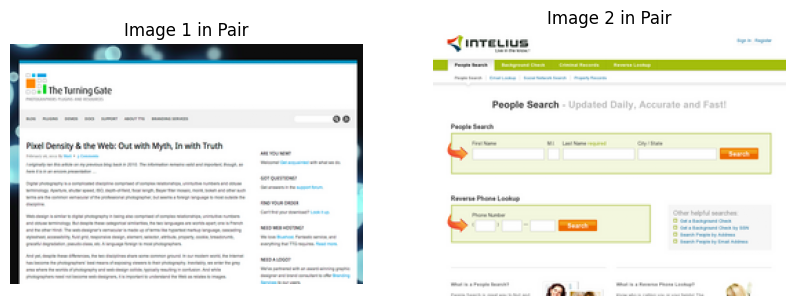

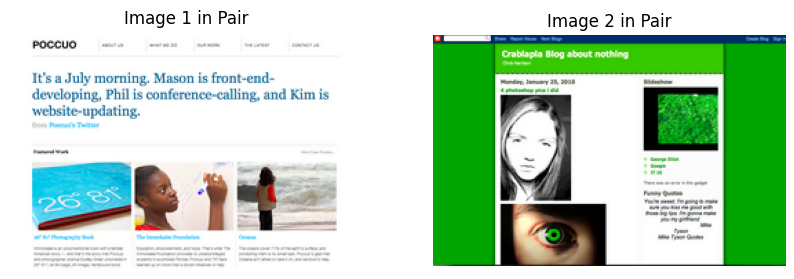

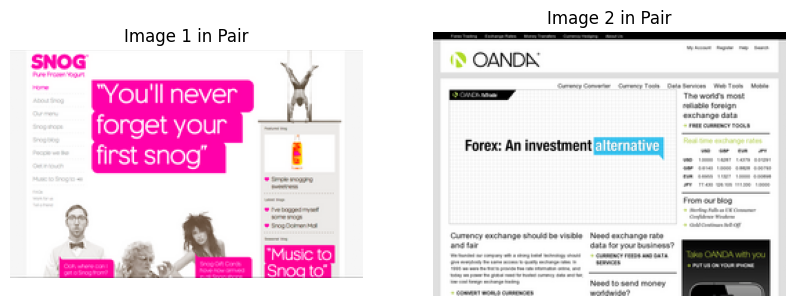

In [9]:
  # Display 3 random pairs of images side by side
for pair in train_image_pairs[:3]:
    img1 = mping.imread(pair[0])  # Read the first image in the pair
    img2 = mping.imread(pair[1])  # Read the second image in the pair

    # Create a figure with two subplots side by side
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Plot the first image on the first subplot
    axs[0].imshow(img1)
    axs[0].set_title('Image 1 in Pair')
    axs[0].axis('off')  # Hide axes

    # Plot the second image on the second subplot
    axs[1].imshow(img2)
    axs[1].set_title('Image 2 in Pair')
    axs[1].axis('off')  # Hide axes

    # Display the plot
    plt.show()

Read the images as numpy arrays


In [10]:
def read_and_process_image_pairs(list_of_image_pairs):
    X = []

    for image1, image2 in list_of_image_pairs:
        img1 = cv2.imread(image1, cv2.IMREAD_COLOR)
        img2 = cv2.imread(image2, cv2.IMREAD_COLOR)

        #  Resize images if needed
        img1 = cv2.resize(img1, (width, height), interpolation=cv2.INTER_AREA)
        img2 = cv2.resize(img2, (width, height), interpolation=cv2.INTER_AREA)

        X.append((img1, img2))

    return X

 # Process training image pairs
X_pairs_train = np.array(read_and_process_image_pairs(train_image_pairs))
y_pairs_train = np.array(train_labels)

# Process validation image pairs
X_pairs_val = np.array(read_and_process_image_pairs(test_image_pairs))
y_pairs_val = np.array(test_labels)

# print(f"training pairs shape:   ",X_pairs_train.shape )

Display the first 3 images to make sure everything is okay


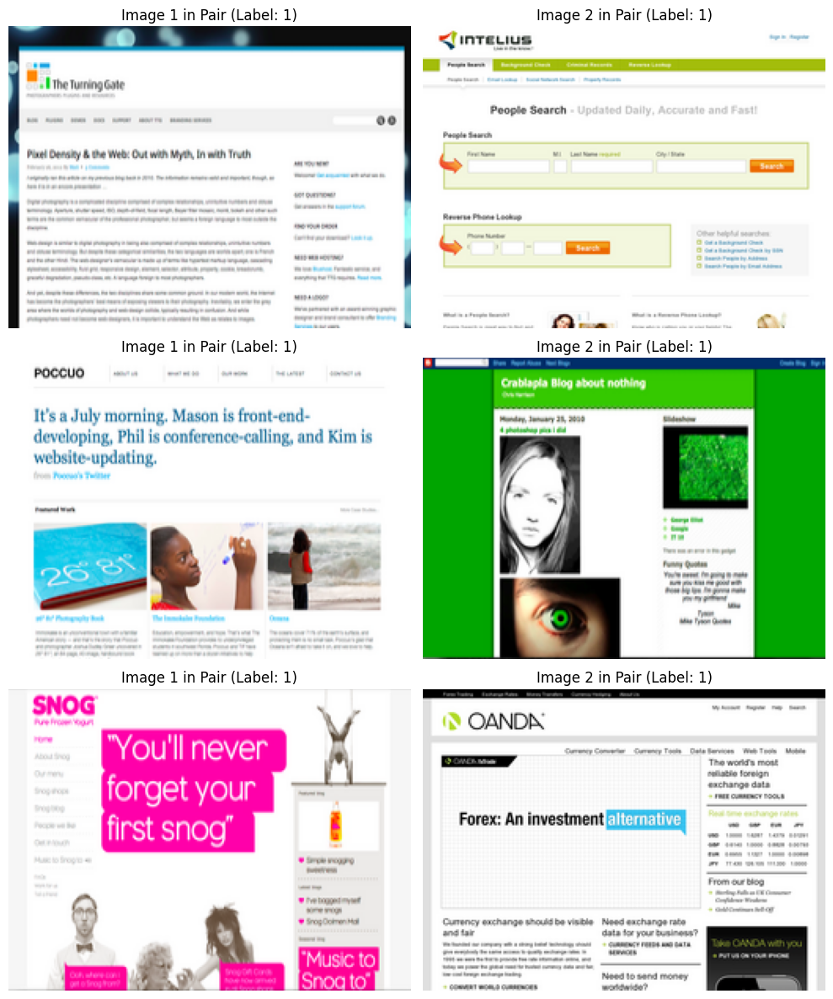

In [11]:
# Number of pairs to display
num_pairs_to_display = 3

# Create subplots
fig, axes = plt.subplots(num_pairs_to_display, 2, figsize=(10, 4 * num_pairs_to_display))

for i in range(num_pairs_to_display):
    img1, img2 = X_pairs_train[i]
    label = y_pairs_train[i]

    # Display the first image in the pair
    axes[i, 0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f'Image 1 in Pair (Label: {label})')
    axes[i, 0].axis('off')

    # Display the second image in the pair
    axes[i, 1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title(f'Image 2 in Pair (Label: {label})')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

Get the weights of the pretrained model. This model is pretrained on the Flickr style dataset (containing 80 K images) for image style recognition task. It aims at the artistic aspect recognition of photographs and it is fine-tuned from another network which has been pretrained on the ImageNet dataset for object recognition task.


In [12]:
import h5py

def traverse_datasets(hdf_file):

    def h5py_dataset_iterator(g, prefix=''):
        for key in g.keys():
            item = g[key]
            path = f'{prefix}/{key}'    
            if isinstance(item, h5py.Dataset): # test for dataset
                yield (path, item)
            elif isinstance(item, h5py.Group): # test for group (go down)
                yield from h5py_dataset_iterator(item, path)

    with h5py.File(hdf_file, 'r') as f:
        for path, _ in h5py_dataset_iterator(f):
            yield path

weights = {}
filename = '../../Calista/pretrainedModels/flickr_style.h5'

with h5py.File(filename, 'r') as f:
    for dset in traverse_datasets(filename):
        print('Path:', dset)
        # print('Shape:', f[dset].shape)
        # print('Data type:', f[dset].dtype)
        weights[dset] = f[dset][:]

conv1_bias = weights['/conv1/conv1/bias:0']
conv1_kernel = weights['/conv1/conv1/kernel:0']
conv2_bias = weights['/conv2/conv2/bias:0']
conv2_kernel = weights['/conv2/conv2/kernel:0']
conv3_bias = weights['/conv3/conv3/bias:0']
conv3_kernel = weights['/conv3/conv3/kernel:0']
conv4_bias = weights['/conv4/conv4/bias:0']
conv4_kernel = weights['/conv4/conv4/kernel:0']
conv5_bias = weights['/conv5/conv5/bias:0']
conv5_kernel = weights['/conv5/conv5/kernel:0']


Path: /conv1/conv1/bias:0
Path: /conv1/conv1/kernel:0
Path: /conv2/conv2/bias:0
Path: /conv2/conv2/kernel:0
Path: /conv3/conv3/bias:0
Path: /conv3/conv3/kernel:0
Path: /conv4/conv4/bias:0
Path: /conv4/conv4/kernel:0
Path: /conv5/conv5/bias:0
Path: /conv5/conv5/kernel:0
Path: /fc6/fc6/bias:0
Path: /fc6/fc6/kernel:0
Path: /fc7/fc7/bias:0
Path: /fc7/fc7/kernel:0
Path: /fc8_flickr/fc8_flickr/bias:0
Path: /fc8_flickr/fc8_flickr/kernel:0


Implement the LRN normaliazation


In [13]:
import tensorflow as tf
from tensorflow import keras
from keras import layers, models, regularizers, initializers
from keras.layers import Layer
from keras import backend as K
import numpy as np
import random


# from lrn_layer import LRN

class LRN(Layer):

    def __init__(self, n=5, alpha=0.0001, beta=0.75, k=2, **kwargs):
        self.n = n
        self.alpha = alpha
        self.beta = beta
        self.k = k
        super(LRN, self).__init__(**kwargs)

    def build(self, input_shape):
        self.shape = input_shape
        super(LRN, self).build(input_shape)

    def call(self, x, mask=None):
        if K.image_data_format() == "channels_first":
            _, f, r, c = self.shape
        else:
            _, r, c, f = self.shape
        half_n = self.n // 2
        squared = tf.square(x)
        pooled = tf.nn.pool(squared, window_shape=(half_n, half_n), pooling_type='AVG', strides=(1, 1),
                         padding="SAME")
        if K.image_data_format() == "channels_first":
            summed = tf.reduce_sum(pooled, axis=1, keepdims=True)
            averaged = (self.alpha / self.n) * tf.repeat(summed, f, axis=1)
        else:
            summed = tf.reduce_sum(pooled, axis=3, keepdims=True)
            averaged = (self.alpha / self.n) * tf.repeat(summed, f, axis=3)
        denom = tf.pow(self.k + averaged, self.beta)
        return x / denom

    def get_output_shape_for(self, input_shape):
        return input_shape


Define the shared feature extractor


In [14]:
class SharedFeatureExtractor:
    def __init__(self, input_shape=(192, 256, 3), l=0.001):
        self.input_shape = input_shape
        self.l = l

    def build_model(self):
        im_data = layers.Input(shape=self.input_shape, dtype='float32', name='im_data')

        conv1 = layers.Conv2D(96, kernel_size=(11, 11), strides=(4, 4), name='conv1',
                              activation='relu', input_shape=self.input_shape,
                              kernel_regularizer=regularizers.l2(self.l))(im_data)

        pool1 = layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding="same", name='pool1')(conv1)
        norm1 = LRN(name='norm1')(pool1)
        drop1 = layers.Dropout(0.1, name='dropout1')(norm1)

        layer1_1 = layers.Lambda(lambda x: x[:, :, :, :48], name='split1_1')(drop1)
        layer1_2 = layers.Lambda(lambda x: x[:, :, :, 48:], name='split1_2')(drop1)

        conv2_1 = layers.Conv2D(128, kernel_size=(5, 5), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv2_1', kernel_regularizer=regularizers.l2(self.l))(layer1_1)

        conv2_2 = layers.Conv2D(128, kernel_size=(5, 5), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv2_2', kernel_regularizer=regularizers.l2(self.l))(layer1_2)

        conv2 = layers.Concatenate(name='conv_2')([conv2_1, conv2_2])

        pool2 = layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool2')(conv2)
        norm2 = LRN(name="norm2")(pool2)
        drop2 = layers.Dropout(0.1, name='dropout2')(norm2)

        conv3 = layers.Conv2D(384, kernel_size=(3, 3), strides=(1, 1), activation='relu',
                              name='conv3', padding='same',
                              kernel_regularizer=regularizers.l2(self.l))(drop2)
        drop3 = layers.Dropout(0.1, name='dropout3')(conv3)

        layer3_1 = layers.Lambda(lambda x: x[:, :, :, :192], name='split3_1')(drop3)
        layer3_2 = layers.Lambda(lambda x: x[:, :, :, 192:], name='split3_2')(drop3)

        conv4_1 = layers.Conv2D(192, kernel_size=(3, 3), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv4_1', kernel_regularizer=regularizers.l2(self.l))(layer3_1)

        conv4_2 = layers.Conv2D(192, kernel_size=(3, 3), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv4_2', kernel_regularizer=regularizers.l2(self.l))(layer3_2)

        conv4 = layers.Concatenate(name='conv_4')([conv4_1, conv4_2])

        layer4_1 = layers.Lambda(lambda x: x[:, :, :, :192], name='split4_1')(conv4)
        layer4_2 = layers.Lambda(lambda x: x[:, :, :, 192:], name='split4_2')(conv4)

        conv5_1 = layers.Conv2D(128, kernel_size=(3, 3), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv5_1', kernel_regularizer=regularizers.l2(self.l))(layer4_1)

        conv5_2 = layers.Conv2D(128, kernel_size=(3, 3), strides=(1, 1),
                                activation='relu', padding='same',
                                name='conv5_2', kernel_regularizer=regularizers.l2(self.l))(layer4_2)

        conv5 = layers.Concatenate(name='conv_5')([conv5_1, conv5_2])

        pool5 = layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2), name='pool5')(conv5)

        shared_model = models.Model(inputs=im_data, outputs=pool5, name='shared_feature_extractor')
        return shared_model

Define the rating head task


In [15]:
class RatingModel:
    def __init__(self, shared_base, l=0.001):
        self.shared_base = shared_base
        self.l = l

    def build_model(self):
        flat = layers.Flatten()(self.shared_base.output)
        fc6 = layers.Dense(1024, activation='relu', name='Ratingfc6',
                           kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01),
                           bias_initializer='zeros',
                           kernel_regularizer=regularizers.l2(self.l))(flat)
        drop6 = layers.Dropout(0.5, name='RatingDropout6')(fc6) 

        fc7 = layers.Dense(512, activation='relu', name='Ratingfc7',
                           kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01),
                           bias_initializer='zeros',
                           kernel_regularizer=regularizers.l2(self.l))(drop6)
        drop7 = layers.Dropout(0.5, name='RatingDropout7')(fc7)

        fc8 = layers.Dense(1, name='rating_output',
                           kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01),
                           bias_initializer='zeros')(drop7)

        rating_model = models.Model(inputs=self.shared_base.input, outputs=fc8, name='rating_model')

        return rating_model

Define the comparison head task


In [16]:
class ComparisonModel:
    def __init__(self, shared_base, l=0.001):
        self.shared_base = shared_base
        self.l = l
        self.input_shape = shared_base.input_shape[1:]

    def build_model(self):
        input_a = layers.Input(shape=self.input_shape, dtype='float32', name='input_a')
        input_b = layers.Input(shape=self.input_shape, dtype='float32', name='input_b')

        output_a = self.shared_base(input_a)
        output_b = self.shared_base(input_b)

        flat_a = layers.Flatten()(output_a)
        flat_b = layers.Flatten()(output_b)

        # Define Shared Layers
        shared_fc6 = layers.Dense(1024, activation='relu', name='Comparisonfc6', kernel_regularizer=regularizers.l2(self.l),
                                  kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01), bias_initializer='zeros')
        shared_drop6 = layers.Dropout(0.5, name='ComparisonDropout6')
        shared_fc7 = layers.Dense(512, activation='relu', name='Comparisonfc7', kernel_regularizer=regularizers.l2(self.l),
                                  kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01), bias_initializer='zeros')
        shared_drop7 = layers.Dropout(0.5, name='ComparisonDropout7')
        shared_fc8 = layers.Dense(1, name='Comparisonfc8',
                                  kernel_initializer=initializers.RandomNormal(mean=0.0, stddev=0.01), bias_initializer='zeros')

        # Apply Shared Layers to input_a
        fc6_a = shared_fc6(flat_a)
        drop6_a = shared_drop6(fc6_a)
        fc7_a = shared_fc7(drop6_a)
        drop7_a = shared_drop7(fc7_a)
        fc8_a = shared_fc8(drop7_a)

        # Apply Shared Layers to input_b
        fc6_b = shared_fc6(flat_b)
        drop6_b = shared_drop6(fc6_b)
        fc7_b = shared_fc7(drop6_b)
        drop7_b = shared_drop7(fc7_b)
        fc8_b = shared_fc8(drop7_b)

        difference = layers.Subtract(name='Difference')([fc8_a, fc8_b])

        comparison_output = layers.Activation('tanh', name='comparison_output')(difference)

        comparison_model = models.Model(inputs=[input_a, input_b], outputs=comparison_output, name='comparison_model')

        return comparison_model

Construct the CNN.


In [17]:
model_base = SharedFeatureExtractor()
shared_feature_extractor = model_base.build_model()
rating_task = RatingModel(shared_feature_extractor)
rating_model = rating_task.build_model()
comparison_task = ComparisonModel(shared_feature_extractor)
comparison_model = comparison_task.build_model()

# Step 5: Define inputs for the joint model
rating_input = layers.Input(shape=(192, 256, 3), name='rating_input')
comparison_input_a = layers.Input(shape=(192, 256, 3), name='comparison_input_a')
comparison_input_b = layers.Input(shape=(192, 256, 3), name='comparison_input_b')

# Step 6: Define outputs for the joint model
rating_output = rating_model(rating_input)
comparison_output = comparison_model([comparison_input_a, comparison_input_b])

2024-08-31 12:16:30.631078: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-08-31 12:16:30.663403: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-08-31 12:16:30.663583: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Call the function to construct the joint-training model.


In [18]:
joint_model = models.Model(
    inputs=[rating_input, comparison_input_a, comparison_input_b],
    outputs=[rating_output, comparison_output],
    name='joint_model'
)


Initialize the weights of the first 5 convolutional layers of the models with the weights of the pretrained model.


In [19]:
shared_feature_extractor.get_layer('conv1').set_weights([conv1_kernel[:, :, :, :], conv1_bias[:]])
shared_feature_extractor.get_layer('conv2_1').set_weights([conv2_kernel[:, :, :, :128], conv2_bias[:128]])
shared_feature_extractor.get_layer('conv2_2').set_weights([conv2_kernel[:, :, :, 128:], conv2_bias[128:]])
shared_feature_extractor.get_layer('conv3').set_weights([conv3_kernel[:, :, :, :], conv3_bias[:]])
shared_feature_extractor.get_layer('conv4_1').set_weights([conv4_kernel[:, :, :, :192], conv4_bias[:192]])
shared_feature_extractor.get_layer('conv4_2').set_weights([conv4_kernel[:, :, :, 192:], conv4_bias[192:]])
shared_feature_extractor.get_layer('conv5_1').set_weights([conv5_kernel[:, :, :, :128], conv5_bias[:128]])
shared_feature_extractor.get_layer('conv5_2').set_weights([conv5_kernel[:, :, :, 128:], conv5_bias[128:]])

# Print the summaries of the individual sub-models
print("\nShared Feature Extractor Summary:")
shared_feature_extractor.summary()

print("\nRating Model Summary:")
rating_model.summary()

print("\nComparison Model Summary:")
comparison_model.summary()

# Print the summary of the joint model
print("Joint Model Summary:")
joint_model.summary()



Shared Feature Extractor Summary:
Model: "shared_feature_extractor"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 im_data (InputLayer)        [(None, 192, 256, 3)]        0         []                            
                                                                                                  
 conv1 (Conv2D)              (None, 46, 62, 96)           34944     ['im_data[0][0]']             
                                                                                                  
 pool1 (MaxPooling2D)        (None, 23, 31, 96)           0         ['conv1[0][0]']               
                                                                                                  
 norm1 (LRN)                 (None, 23, 31, 96)           0         ['pool1[0][0]']               
                                        

Define the loss functions (MSE Loss and Bradley-Terry based loss) and the metric (RMSE, Accuracy) that will be used


In [20]:
# Custom RMSE function for rating output
def rating_rmse(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true), axis=-1))

# Custom accuracy function for the comparison output 
def custom_binary_accuracy(y_true, y_pred):
    # Use 0.0 as the threshold for tanh output
    y_pred = tf.where(y_pred >= 0.0, 1.0, -1.0)  # Convert predictions to 1 or -1
    y_true = tf.cast(y_true, tf.float32)
    return tf.reduce_mean(tf.cast(tf.equal(y_true, y_pred), tf.float32))

# def euclidean_distance_loss(y_true, y_pred):
#     y_true = tf.cast(y_true, tf.float32)
#     y_pred = tf.cast(y_pred, tf.float32)
#     return 0.5 * tf.reduce_mean(tf.square(y_pred - y_true), axis=-1)

# Define the regression loss for the aesthetic rating task (mean squared error)
def mse_regression_loss(y_true, y_pred):
    return tf.reduce_mean(tf.square(y_pred - y_true))

# Define the Bradley-Terry based loss for the comparison task
def bradley_terry_loss(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return tf.reduce_mean(tf.math.log(1 + tf.exp(-y_true * y_pred)))

In [21]:
batch_size = 32
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, X_rating, y_rating, X_pairs, y_pairs, batch_size, normalize=True):
        self.X_rating = X_rating
        self.y_rating = y_rating
        self.X_pairs = X_pairs
        self.y_pairs = y_pairs
        self.batch_size = batch_size
        self.normalize = normalize
        self.indexes = np.arange(len(self.X_rating))
        self.on_epoch_end()
        
    def __len__(self):
        return int(np.floor(len(self.X_rating) / self.batch_size))

    def __getitem__(self, index):
        batch_indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        
        X_rating_batch = self.X_rating[batch_indexes]
        y_rating_batch = self.y_rating[batch_indexes]
        
        X_pairs_batch = self.X_pairs[batch_indexes]
        y_pairs_batch = self.y_pairs[batch_indexes]
        
        comparison_input_a = np.array([pair[0] for pair in X_pairs_batch])
        comparison_input_b = np.array([pair[1] for pair in X_pairs_batch])
        
        if self.normalize:
            X_rating_batch = self.normalize_images(X_rating_batch)
            comparison_input_a = self.normalize_images(comparison_input_a)
            comparison_input_b = self.normalize_images(comparison_input_b)
        
        return [X_rating_batch, comparison_input_a, comparison_input_b], [y_rating_batch, y_pairs_batch]
    
    def on_epoch_end(self):
        np.random.shuffle(self.indexes)
    
    def normalize_images(self, images):
        return images / 255.0

train_generator = DataGenerator(X_train, y_train, X_pairs_train, y_pairs_train, batch_size)
val_generator = DataGenerator(X_val, y_val, X_pairs_val, y_pairs_val, batch_size)     

Compile the model.


In [22]:

from keras.utils import get_custom_objects
from keras import callbacks
from keras import losses

epochs = 141

base_lr = 1e-3
initial_learning_rate = base_lr
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=100000,
    decay_rate=0.96,
    staircase=True)

adam_optimizer = tf.keras.optimizers.Adam(initial_learning_rate)

sgd = tf.keras.optimizers.SGD(learning_rate=lr_schedule, momentum=0.9, nesterov=True)


# Register the custom loss functions and metrics
get_custom_objects().update({
    'mse_regression_loss': mse_regression_loss,
    'bradley_terry_loss': bradley_terry_loss,
    'rating_rmse': rating_rmse,
    'custom_binary_accuracy': custom_binary_accuracy
})


joint_model.compile(
    optimizer=sgd, 
    loss={
        'rating_model': losses.MeanAbsoluteError(), 
        'comparison_model': 'bradley_terry_loss'
    },
    loss_weights={
        'rating_model': 0.5,  # Weight for rating loss
        'comparison_model': 0.55   # Weight for comparison loss
    },  
    metrics={
        'rating_model': 'rating_rmse', 
        'comparison_model': 'custom_binary_accuracy'
    } 
)

# Train the joint model
history = joint_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=epochs
)

Epoch 1/300


2024-08-31 12:16:34.517445: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape injoint_model/comparison_model/shared_feature_extractor/dropout1/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-08-31 12:16:34.889037: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2024-08-31 12:16:35.962648: I external/local_xla/xla/service/service.cc:168] XLA service 0x7d71f00038b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-08-31 12:16:35.962673: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1060 6GB, Compute Capability 6.1
I0000 00:00:1725095796.009993 2592983 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


9/9 [==============================] - 7s 305ms/step - loss: 5.6003 - rating_model_loss: 4.3033 - comparison_model_loss: 0.6932 - rating_model_rating_rmse: 4.3033 - comparison_model_custom_binary_accuracy: 0.4757 - val_loss: 5.6099 - val_rating_model_loss: 4.3215 - val_comparison_model_loss: 0.6931 - val_rating_model_rating_rmse: 4.3215 - val_comparison_model_custom_binary_accuracy: 0.5104
Epoch 2/300
9/9 [==============================] - 2s 236ms/step - loss: 5.5859 - rating_model_loss: 4.2784 - comparison_model_loss: 0.6931 - rating_model_rating_rmse: 4.2784 - comparison_model_custom_binary_accuracy: 0.4965 - val_loss: 5.5869 - val_rating_model_loss: 4.2811 - val_comparison_model_loss: 0.6931 - val_rating_model_rating_rmse: 4.2811 - val_comparison_model_custom_binary_accuracy: 0.5208
Epoch 3/300
9/9 [==============================] - 2s 234ms/step - loss: 5.5727 - rating_model_loss: 4.2561 - comparison_model_loss: 0.6931 - rating_model_rating_rmse: 4.2561 - comparison_model_custom_b

/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 91 - val_pearson_correlation: 0.7360 (p=5.97e-18, CI=[0.63, 0.82]) - val_rmse: 0.6559 - val_accuracy: 0.6852
9/9 [==============================] - 27s 3s/step - loss: 3.4299 - rating_model_loss: 0.6095 - comparison_model_loss: 0.6023 - rating_model_rating_rmse: 0.6095 - comparison_model_custom_binary_accuracy: 0.6840 - val_loss: 3.3647 - val_rating_model_loss: 0.5115 - val_comparison_model_loss: 0.5827 - val_rating_model_rating_rmse: 0.5115 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 92/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 92 - val_pearson_correlation: 0.7414 (p=2.52e-18, CI=[0.64, 0.82]) - val_rmse: 0.6502 - val_accuracy: 0.6878
9/9 [==============================] - 27s 3s/step - loss: 3.4591 - rating_model_loss: 0.6618 - comparison_model_loss: 0.6049 - rating_model_rating_rmse: 0.6618 - comparison_model_custom_binary_accuracy: 0.6736 - val_loss: 3.3617 - val_rating_model_loss: 0.5062 - val_comparison_model_loss: 0.5843 - val_rating_model_rating_rmse: 0.5062 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 93/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 93 - val_pearson_correlation: 0.7488 (p=7.67e-19, CI=[0.65, 0.82]) - val_rmse: 0.6789 - val_accuracy: 0.6852
9/9 [==============================] - 27s 3s/step - loss: 3.4634 - rating_model_loss: 0.6664 - comparison_model_loss: 0.6098 - rating_model_rating_rmse: 0.6664 - comparison_model_custom_binary_accuracy: 0.6771 - val_loss: 3.3895 - val_rating_model_loss: 0.5518 - val_comparison_model_loss: 0.5910 - val_rating_model_rating_rmse: 0.5518 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 94/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 94 - val_pearson_correlation: 0.7585 (p=1.50e-19, CI=[0.66, 0.83]) - val_rmse: 0.7515 - val_accuracy: 0.6878
9/9 [==============================] - 27s 3s/step - loss: 3.4521 - rating_model_loss: 0.6376 - comparison_model_loss: 0.6197 - rating_model_rating_rmse: 0.6376 - comparison_model_custom_binary_accuracy: 0.6597 - val_loss: 3.4043 - val_rating_model_loss: 0.5821 - val_comparison_model_loss: 0.5893 - val_rating_model_rating_rmse: 0.5821 - val_comparison_model_custom_binary_accuracy: 0.7292
Epoch 95/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 95 - val_pearson_correlation: 0.7512 (p=5.14e-19, CI=[0.65, 0.83]) - val_rmse: 0.6606 - val_accuracy: 0.6905
9/9 [==============================] - 27s 3s/step - loss: 3.4422 - rating_model_loss: 0.6467 - comparison_model_loss: 0.5945 - rating_model_rating_rmse: 0.6467 - comparison_model_custom_binary_accuracy: 0.6944 - val_loss: 3.3811 - val_rating_model_loss: 0.5383 - val_comparison_model_loss: 0.5927 - val_rating_model_rating_rmse: 0.5383 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 96/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 96 - val_pearson_correlation: 0.7603 (p=1.09e-19, CI=[0.66, 0.83]) - val_rmse: 0.6520 - val_accuracy: 0.6799
9/9 [==============================] - 27s 3s/step - loss: 3.4329 - rating_model_loss: 0.6301 - comparison_model_loss: 0.5959 - rating_model_rating_rmse: 0.6301 - comparison_model_custom_binary_accuracy: 0.7257 - val_loss: 3.3581 - val_rating_model_loss: 0.5009 - val_comparison_model_loss: 0.5900 - val_rating_model_rating_rmse: 0.5009 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 97/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 97 - val_pearson_correlation: 0.7477 (p=9.11e-19, CI=[0.65, 0.82]) - val_rmse: 0.6432 - val_accuracy: 0.6799
9/9 [==============================] - 27s 3s/step - loss: 3.4418 - rating_model_loss: 0.6341 - comparison_model_loss: 0.6097 - rating_model_rating_rmse: 0.6341 - comparison_model_custom_binary_accuracy: 0.6632 - val_loss: 3.3619 - val_rating_model_loss: 0.5162 - val_comparison_model_loss: 0.5835 - val_rating_model_rating_rmse: 0.5162 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 98/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 98 - val_pearson_correlation: 0.7504 (p=5.83e-19, CI=[0.65, 0.83]) - val_rmse: 0.6506 - val_accuracy: 0.6825
9/9 [==============================] - 27s 3s/step - loss: 3.4334 - rating_model_loss: 0.6295 - comparison_model_loss: 0.6009 - rating_model_rating_rmse: 0.6295 - comparison_model_custom_binary_accuracy: 0.6806 - val_loss: 3.3451 - val_rating_model_loss: 0.4850 - val_comparison_model_loss: 0.5858 - val_rating_model_rating_rmse: 0.4850 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 99/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 99 - val_pearson_correlation: 0.7581 (p=1.60e-19, CI=[0.66, 0.83]) - val_rmse: 0.6914 - val_accuracy: 0.6825
9/9 [==============================] - 27s 3s/step - loss: 3.4202 - rating_model_loss: 0.6099 - comparison_model_loss: 0.5982 - rating_model_rating_rmse: 0.6099 - comparison_model_custom_binary_accuracy: 0.6701 - val_loss: 3.3567 - val_rating_model_loss: 0.5059 - val_comparison_model_loss: 0.5878 - val_rating_model_rating_rmse: 0.5059 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 100/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 100 - val_pearson_correlation: 0.7639 (p=5.75e-20, CI=[0.67, 0.84]) - val_rmse: 0.6324 - val_accuracy: 0.6799
9/9 [==============================] - 26s 3s/step - loss: 3.4594 - rating_model_loss: 0.6702 - comparison_model_loss: 0.6110 - rating_model_rating_rmse: 0.6702 - comparison_model_custom_binary_accuracy: 0.6632 - val_loss: 3.3555 - val_rating_model_loss: 0.4995 - val_comparison_model_loss: 0.5937 - val_rating_model_rating_rmse: 0.4995 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 101/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 101 - val_pearson_correlation: 0.7641 (p=5.57e-20, CI=[0.67, 0.84]) - val_rmse: 0.6772 - val_accuracy: 0.6825
9/9 [==============================] - 27s 3s/step - loss: 3.4174 - rating_model_loss: 0.6116 - comparison_model_loss: 0.5950 - rating_model_rating_rmse: 0.6116 - comparison_model_custom_binary_accuracy: 0.7049 - val_loss: 3.3632 - val_rating_model_loss: 0.5265 - val_comparison_model_loss: 0.5825 - val_rating_model_rating_rmse: 0.5265 - val_comparison_model_custom_binary_accuracy: 0.7292
Epoch 102/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 102 - val_pearson_correlation: 0.7522 (p=4.34e-19, CI=[0.65, 0.83]) - val_rmse: 0.6348 - val_accuracy: 0.6799
9/9 [==============================] - 27s 3s/step - loss: 3.4263 - rating_model_loss: 0.6316 - comparison_model_loss: 0.5929 - rating_model_rating_rmse: 0.6316 - comparison_model_custom_binary_accuracy: 0.7083 - val_loss: 3.3533 - val_rating_model_loss: 0.5053 - val_comparison_model_loss: 0.5874 - val_rating_model_rating_rmse: 0.5053 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 103/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 103 - val_pearson_correlation: 0.7512 (p=5.13e-19, CI=[0.65, 0.83]) - val_rmse: 0.6492 - val_accuracy: 0.6852
9/9 [==============================] - 28s 3s/step - loss: 3.4277 - rating_model_loss: 0.6231 - comparison_model_loss: 0.6056 - rating_model_rating_rmse: 0.6231 - comparison_model_custom_binary_accuracy: 0.6701 - val_loss: 3.3603 - val_rating_model_loss: 0.5182 - val_comparison_model_loss: 0.5890 - val_rating_model_rating_rmse: 0.5182 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 104/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 104 - val_pearson_correlation: 0.7449 (p=1.44e-18, CI=[0.64, 0.82]) - val_rmse: 0.7177 - val_accuracy: 0.6720
9/9 [==============================] - 27s 3s/step - loss: 3.4282 - rating_model_loss: 0.6310 - comparison_model_loss: 0.6005 - rating_model_rating_rmse: 0.6310 - comparison_model_custom_binary_accuracy: 0.6875 - val_loss: 3.3914 - val_rating_model_loss: 0.5904 - val_comparison_model_loss: 0.5751 - val_rating_model_rating_rmse: 0.5904 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 105/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 105 - val_pearson_correlation: 0.7574 (p=1.81e-19, CI=[0.66, 0.83]) - val_rmse: 0.6341 - val_accuracy: 0.6878
9/9 [==============================] - 27s 3s/step - loss: 3.4322 - rating_model_loss: 0.6445 - comparison_model_loss: 0.5959 - rating_model_rating_rmse: 0.6445 - comparison_model_custom_binary_accuracy: 0.6910 - val_loss: 3.3364 - val_rating_model_loss: 0.4878 - val_comparison_model_loss: 0.5794 - val_rating_model_rating_rmse: 0.4878 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 106/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 106 - val_pearson_correlation: 0.7536 (p=3.43e-19, CI=[0.65, 0.83]) - val_rmse: 0.7075 - val_accuracy: 0.6852
9/9 [==============================] - 28s 3s/step - loss: 3.4317 - rating_model_loss: 0.6489 - comparison_model_loss: 0.5925 - rating_model_rating_rmse: 0.6489 - comparison_model_custom_binary_accuracy: 0.7014 - val_loss: 3.3625 - val_rating_model_loss: 0.5308 - val_comparison_model_loss: 0.5856 - val_rating_model_rating_rmse: 0.5308 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 107/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 107 - val_pearson_correlation: 0.7500 (p=6.31e-19, CI=[0.65, 0.83]) - val_rmse: 0.6386 - val_accuracy: 0.6852
9/9 [==============================] - 27s 3s/step - loss: 3.4274 - rating_model_loss: 0.6382 - comparison_model_loss: 0.5970 - rating_model_rating_rmse: 0.6382 - comparison_model_custom_binary_accuracy: 0.7049 - val_loss: 3.3435 - val_rating_model_loss: 0.4979 - val_comparison_model_loss: 0.5857 - val_rating_model_rating_rmse: 0.4979 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 108/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 108 - val_pearson_correlation: 0.7631 (p=6.62e-20, CI=[0.67, 0.84]) - val_rmse: 0.6221 - val_accuracy: 0.6878
9/9 [==============================] - 28s 3s/step - loss: 3.4017 - rating_model_loss: 0.5956 - comparison_model_loss: 0.5946 - rating_model_rating_rmse: 0.5956 - comparison_model_custom_binary_accuracy: 0.7118 - val_loss: 3.3372 - val_rating_model_loss: 0.4870 - val_comparison_model_loss: 0.5869 - val_rating_model_rating_rmse: 0.4870 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 109/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 109 - val_pearson_correlation: 0.7591 (p=1.33e-19, CI=[0.66, 0.83]) - val_rmse: 0.6349 - val_accuracy: 0.6878
9/9 [==============================] - 27s 3s/step - loss: 3.3945 - rating_model_loss: 0.5778 - comparison_model_loss: 0.6012 - rating_model_rating_rmse: 0.5778 - comparison_model_custom_binary_accuracy: 0.7049 - val_loss: 3.3344 - val_rating_model_loss: 0.4854 - val_comparison_model_loss: 0.5853 - val_rating_model_rating_rmse: 0.4854 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 110/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 110 - val_pearson_correlation: 0.7608 (p=9.92e-20, CI=[0.66, 0.83]) - val_rmse: 0.6387 - val_accuracy: 0.6905
9/9 [==============================] - 28s 3s/step - loss: 3.3936 - rating_model_loss: 0.6045 - comparison_model_loss: 0.5744 - rating_model_rating_rmse: 0.6045 - comparison_model_custom_binary_accuracy: 0.7361 - val_loss: 3.3499 - val_rating_model_loss: 0.5128 - val_comparison_model_loss: 0.5878 - val_rating_model_rating_rmse: 0.5128 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 111/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 111 - val_pearson_correlation: 0.7626 (p=7.28e-20, CI=[0.66, 0.83]) - val_rmse: 0.6608 - val_accuracy: 0.6905
9/9 [==============================] - 27s 3s/step - loss: 3.3952 - rating_model_loss: 0.6088 - comparison_model_loss: 0.5748 - rating_model_rating_rmse: 0.6088 - comparison_model_custom_binary_accuracy: 0.7292 - val_loss: 3.3444 - val_rating_model_loss: 0.5094 - val_comparison_model_loss: 0.5828 - val_rating_model_rating_rmse: 0.5094 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 112/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 112 - val_pearson_correlation: 0.7609 (p=9.82e-20, CI=[0.66, 0.83]) - val_rmse: 0.6925 - val_accuracy: 0.6878
9/9 [==============================] - 28s 3s/step - loss: 3.4089 - rating_model_loss: 0.6285 - comparison_model_loss: 0.5818 - rating_model_rating_rmse: 0.6285 - comparison_model_custom_binary_accuracy: 0.7222 - val_loss: 3.3556 - val_rating_model_loss: 0.5251 - val_comparison_model_loss: 0.5892 - val_rating_model_rating_rmse: 0.5251 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 113/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 113 - val_pearson_correlation: 0.7653 (p=4.55e-20, CI=[0.67, 0.84]) - val_rmse: 0.7502 - val_accuracy: 0.6852
9/9 [==============================] - 27s 3s/step - loss: 3.3917 - rating_model_loss: 0.5996 - comparison_model_loss: 0.5811 - rating_model_rating_rmse: 0.5996 - comparison_model_custom_binary_accuracy: 0.7257 - val_loss: 3.3791 - val_rating_model_loss: 0.5691 - val_comparison_model_loss: 0.5898 - val_rating_model_rating_rmse: 0.5691 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 114/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 114 - val_pearson_correlation: 0.7647 (p=5.05e-20, CI=[0.67, 0.84]) - val_rmse: 0.6239 - val_accuracy: 0.6878
9/9 [==============================] - 28s 3s/step - loss: 3.4001 - rating_model_loss: 0.6024 - comparison_model_loss: 0.5954 - rating_model_rating_rmse: 0.6024 - comparison_model_custom_binary_accuracy: 0.7049 - val_loss: 3.3309 - val_rating_model_loss: 0.4997 - val_comparison_model_loss: 0.5732 - val_rating_model_rating_rmse: 0.4997 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 115/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 115 - val_pearson_correlation: 0.7440 (p=1.68e-18, CI=[0.64, 0.82]) - val_rmse: 0.7150 - val_accuracy: 0.6931
9/9 [==============================] - 28s 3s/step - loss: 3.3943 - rating_model_loss: 0.6023 - comparison_model_loss: 0.5867 - rating_model_rating_rmse: 0.6023 - comparison_model_custom_binary_accuracy: 0.7188 - val_loss: 3.3813 - val_rating_model_loss: 0.5831 - val_comparison_model_loss: 0.5831 - val_rating_model_rating_rmse: 0.5831 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 116/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 116 - val_pearson_correlation: 0.7457 (p=1.28e-18, CI=[0.64, 0.82]) - val_rmse: 0.7010 - val_accuracy: 0.7011
9/9 [==============================] - 28s 3s/step - loss: 3.3858 - rating_model_loss: 0.5967 - comparison_model_loss: 0.5785 - rating_model_rating_rmse: 0.5967 - comparison_model_custom_binary_accuracy: 0.6979 - val_loss: 3.3746 - val_rating_model_loss: 0.5717 - val_comparison_model_loss: 0.5841 - val_rating_model_rating_rmse: 0.5717 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 117/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 117 - val_pearson_correlation: 0.7525 (p=4.16e-19, CI=[0.65, 0.83]) - val_rmse: 0.6388 - val_accuracy: 0.6905
9/9 [==============================] - 28s 3s/step - loss: 3.3995 - rating_model_loss: 0.6283 - comparison_model_loss: 0.5736 - rating_model_rating_rmse: 0.6283 - comparison_model_custom_binary_accuracy: 0.7222 - val_loss: 3.3387 - val_rating_model_loss: 0.5130 - val_comparison_model_loss: 0.5793 - val_rating_model_rating_rmse: 0.5130 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 118/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 118 - val_pearson_correlation: 0.7496 (p=6.76e-19, CI=[0.65, 0.83]) - val_rmse: 0.6501 - val_accuracy: 0.6931
9/9 [==============================] - 28s 3s/step - loss: 3.4072 - rating_model_loss: 0.6262 - comparison_model_loss: 0.5913 - rating_model_rating_rmse: 0.6262 - comparison_model_custom_binary_accuracy: 0.7049 - val_loss: 3.3274 - val_rating_model_loss: 0.4980 - val_comparison_model_loss: 0.5755 - val_rating_model_rating_rmse: 0.4980 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 119/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 119 - val_pearson_correlation: 0.7561 (p=2.25e-19, CI=[0.66, 0.83]) - val_rmse: 0.6391 - val_accuracy: 0.6984
9/9 [==============================] - 28s 4s/step - loss: 3.4141 - rating_model_loss: 0.6509 - comparison_model_loss: 0.5810 - rating_model_rating_rmse: 0.6509 - comparison_model_custom_binary_accuracy: 0.7118 - val_loss: 3.3373 - val_rating_model_loss: 0.5195 - val_comparison_model_loss: 0.5736 - val_rating_model_rating_rmse: 0.5195 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 120/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 120 - val_pearson_correlation: 0.7711 (p=1.57e-20, CI=[0.68, 0.84]) - val_rmse: 0.6424 - val_accuracy: 0.6878
9/9 [==============================] - 27s 3s/step - loss: 3.3699 - rating_model_loss: 0.5758 - comparison_model_loss: 0.5775 - rating_model_rating_rmse: 0.5758 - comparison_model_custom_binary_accuracy: 0.7222 - val_loss: 3.3281 - val_rating_model_loss: 0.5068 - val_comparison_model_loss: 0.5715 - val_rating_model_rating_rmse: 0.5068 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 121/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 121 - val_pearson_correlation: 0.7599 (p=1.16e-19, CI=[0.66, 0.83]) - val_rmse: 0.6266 - val_accuracy: 0.6878
9/9 [==============================] - 29s 4s/step - loss: 3.3688 - rating_model_loss: 0.5798 - comparison_model_loss: 0.5733 - rating_model_rating_rmse: 0.5798 - comparison_model_custom_binary_accuracy: 0.7292 - val_loss: 3.3201 - val_rating_model_loss: 0.4812 - val_comparison_model_loss: 0.5842 - val_rating_model_rating_rmse: 0.4812 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 122/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 122 - val_pearson_correlation: 0.7627 (p=7.16e-20, CI=[0.66, 0.83]) - val_rmse: 0.6789 - val_accuracy: 0.6931
9/9 [==============================] - 27s 3s/step - loss: 3.3712 - rating_model_loss: 0.6023 - comparison_model_loss: 0.5568 - rating_model_rating_rmse: 0.6023 - comparison_model_custom_binary_accuracy: 0.7326 - val_loss: 3.3581 - val_rating_model_loss: 0.5563 - val_comparison_model_loss: 0.5800 - val_rating_model_rating_rmse: 0.5563 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 123/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 123 - val_pearson_correlation: 0.7616 (p=8.76e-20, CI=[0.66, 0.83]) - val_rmse: 0.6266 - val_accuracy: 0.7011
9/9 [==============================] - 29s 4s/step - loss: 3.3955 - rating_model_loss: 0.6327 - comparison_model_loss: 0.5723 - rating_model_rating_rmse: 0.6327 - comparison_model_custom_binary_accuracy: 0.7118 - val_loss: 3.3291 - val_rating_model_loss: 0.5013 - val_comparison_model_loss: 0.5840 - val_rating_model_rating_rmse: 0.5013 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 124/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 124 - val_pearson_correlation: 0.7639 (p=5.80e-20, CI=[0.67, 0.84]) - val_rmse: 0.6521 - val_accuracy: 0.6958
9/9 [==============================] - 27s 3s/step - loss: 3.3710 - rating_model_loss: 0.5891 - comparison_model_loss: 0.5731 - rating_model_rating_rmse: 0.5891 - comparison_model_custom_binary_accuracy: 0.7222 - val_loss: 3.3302 - val_rating_model_loss: 0.5094 - val_comparison_model_loss: 0.5795 - val_rating_model_rating_rmse: 0.5094 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 125/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 125 - val_pearson_correlation: 0.7565 (p=2.09e-19, CI=[0.66, 0.83]) - val_rmse: 0.6393 - val_accuracy: 0.7037
9/9 [==============================] - 28s 4s/step - loss: 3.3769 - rating_model_loss: 0.6002 - comparison_model_loss: 0.5744 - rating_model_rating_rmse: 0.6002 - comparison_model_custom_binary_accuracy: 0.7153 - val_loss: 3.3383 - val_rating_model_loss: 0.5240 - val_comparison_model_loss: 0.5813 - val_rating_model_rating_rmse: 0.5240 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 126/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 126 - val_pearson_correlation: 0.7627 (p=7.17e-20, CI=[0.66, 0.83]) - val_rmse: 0.6263 - val_accuracy: 0.6931
9/9 [==============================] - 28s 3s/step - loss: 3.3710 - rating_model_loss: 0.5848 - comparison_model_loss: 0.5808 - rating_model_rating_rmse: 0.5848 - comparison_model_custom_binary_accuracy: 0.7083 - val_loss: 3.3209 - val_rating_model_loss: 0.4938 - val_comparison_model_loss: 0.5817 - val_rating_model_rating_rmse: 0.4938 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 127/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 127 - val_pearson_correlation: 0.7565 (p=2.09e-19, CI=[0.66, 0.83]) - val_rmse: 0.6329 - val_accuracy: 0.6984
9/9 [==============================] - 28s 3s/step - loss: 3.3652 - rating_model_loss: 0.5765 - comparison_model_loss: 0.5803 - rating_model_rating_rmse: 0.5765 - comparison_model_custom_binary_accuracy: 0.6875 - val_loss: 3.3304 - val_rating_model_loss: 0.5123 - val_comparison_model_loss: 0.5823 - val_rating_model_rating_rmse: 0.5123 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 128/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 128 - val_pearson_correlation: 0.7704 (p=1.81e-20, CI=[0.68, 0.84]) - val_rmse: 0.6605 - val_accuracy: 0.6905
9/9 [==============================] - 28s 4s/step - loss: 3.3597 - rating_model_loss: 0.5875 - comparison_model_loss: 0.5610 - rating_model_rating_rmse: 0.5875 - comparison_model_custom_binary_accuracy: 0.7708 - val_loss: 3.3264 - val_rating_model_loss: 0.5114 - val_comparison_model_loss: 0.5777 - val_rating_model_rating_rmse: 0.5114 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 129/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 129 - val_pearson_correlation: 0.7638 (p=5.88e-20, CI=[0.67, 0.84]) - val_rmse: 0.6255 - val_accuracy: 0.6958
9/9 [==============================] - 28s 3s/step - loss: 3.3853 - rating_model_loss: 0.6202 - comparison_model_loss: 0.5767 - rating_model_rating_rmse: 0.6202 - comparison_model_custom_binary_accuracy: 0.7188 - val_loss: 3.3154 - val_rating_model_loss: 0.4911 - val_comparison_model_loss: 0.5797 - val_rating_model_rating_rmse: 0.4911 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 130/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 130 - val_pearson_correlation: 0.7648 (p=4.98e-20, CI=[0.67, 0.84]) - val_rmse: 0.6252 - val_accuracy: 0.6931
9/9 [==============================] - 29s 4s/step - loss: 3.3598 - rating_model_loss: 0.5913 - comparison_model_loss: 0.5610 - rating_model_rating_rmse: 0.5913 - comparison_model_custom_binary_accuracy: 0.7396 - val_loss: 3.3132 - val_rating_model_loss: 0.4813 - val_comparison_model_loss: 0.5870 - val_rating_model_rating_rmse: 0.4813 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 131/300
1/1 [==============================] - 0s 24ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 131 - val_pearson_correlation: 0.7600 (p=1.14e-19, CI=[0.66, 0.83]) - val_rmse: 0.6608 - val_accuracy: 0.6984
9/9 [==============================] - 27s 3s/step - loss: 3.3639 - rating_model_loss: 0.5946 - comparison_model_loss: 0.5668 - rating_model_rating_rmse: 0.5946 - comparison_model_custom_binary_accuracy: 0.7396 - val_loss: 3.3339 - val_rating_model_loss: 0.5284 - val_comparison_model_loss: 0.5793 - val_rating_model_rating_rmse: 0.5284 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 132/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 132 - val_pearson_correlation: 0.7583 (p=1.53e-19, CI=[0.66, 0.83]) - val_rmse: 0.6670 - val_accuracy: 0.6984
9/9 [==============================] - 29s 4s/step - loss: 3.3445 - rating_model_loss: 0.5623 - comparison_model_loss: 0.5655 - rating_model_rating_rmse: 0.5623 - comparison_model_custom_binary_accuracy: 0.7535 - val_loss: 3.3341 - val_rating_model_loss: 0.5340 - val_comparison_model_loss: 0.5758 - val_rating_model_rating_rmse: 0.5340 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 133/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 133 - val_pearson_correlation: 0.7722 (p=1.29e-20, CI=[0.68, 0.84]) - val_rmse: 0.6187 - val_accuracy: 0.6746
9/9 [==============================] - 27s 3s/step - loss: 3.3725 - rating_model_loss: 0.5920 - comparison_model_loss: 0.5884 - rating_model_rating_rmse: 0.5920 - comparison_model_custom_binary_accuracy: 0.6944 - val_loss: 3.3180 - val_rating_model_loss: 0.4907 - val_comparison_model_loss: 0.5917 - val_rating_model_rating_rmse: 0.4907 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 134/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 134 - val_pearson_correlation: 0.7707 (p=1.71e-20, CI=[0.68, 0.84]) - val_rmse: 0.6137 - val_accuracy: 0.7011
9/9 [==============================] - 29s 4s/step - loss: 3.3518 - rating_model_loss: 0.5805 - comparison_model_loss: 0.5640 - rating_model_rating_rmse: 0.5805 - comparison_model_custom_binary_accuracy: 0.7361 - val_loss: 3.3082 - val_rating_model_loss: 0.4830 - val_comparison_model_loss: 0.5832 - val_rating_model_rating_rmse: 0.4830 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 135/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 135 - val_pearson_correlation: 0.7557 (p=2.43e-19, CI=[0.66, 0.83]) - val_rmse: 0.6724 - val_accuracy: 0.6958
9/9 [==============================] - 28s 3s/step - loss: 3.3585 - rating_model_loss: 0.6045 - comparison_model_loss: 0.5538 - rating_model_rating_rmse: 0.6045 - comparison_model_custom_binary_accuracy: 0.7569 - val_loss: 3.3402 - val_rating_model_loss: 0.5492 - val_comparison_model_loss: 0.5769 - val_rating_model_rating_rmse: 0.5492 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 136/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 136 - val_pearson_correlation: 0.7719 (p=1.37e-20, CI=[0.68, 0.84]) - val_rmse: 0.6292 - val_accuracy: 0.6852
9/9 [==============================] - 29s 4s/step - loss: 3.3466 - rating_model_loss: 0.5742 - comparison_model_loss: 0.5643 - rating_model_rating_rmse: 0.5742 - comparison_model_custom_binary_accuracy: 0.7465 - val_loss: 3.3154 - val_rating_model_loss: 0.4967 - val_comparison_model_loss: 0.5860 - val_rating_model_rating_rmse: 0.4967 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 137/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 137 - val_pearson_correlation: 0.7740 (p=9.18e-21, CI=[0.68, 0.84]) - val_rmse: 0.6309 - val_accuracy: 0.6825
9/9 [==============================] - 28s 3s/step - loss: 3.3534 - rating_model_loss: 0.5843 - comparison_model_loss: 0.5683 - rating_model_rating_rmse: 0.5843 - comparison_model_custom_binary_accuracy: 0.7188 - val_loss: 3.3244 - val_rating_model_loss: 0.5128 - val_comparison_model_loss: 0.5880 - val_rating_model_rating_rmse: 0.5128 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 138/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 138 - val_pearson_correlation: 0.7705 (p=1.77e-20, CI=[0.68, 0.84]) - val_rmse: 0.6192 - val_accuracy: 0.6958
9/9 [==============================] - 28s 4s/step - loss: 3.3416 - rating_model_loss: 0.5905 - comparison_model_loss: 0.5423 - rating_model_rating_rmse: 0.5905 - comparison_model_custom_binary_accuracy: 0.7743 - val_loss: 3.3013 - val_rating_model_loss: 0.4827 - val_comparison_model_loss: 0.5778 - val_rating_model_rating_rmse: 0.4827 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 139/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 139 - val_pearson_correlation: 0.7646 (p=5.16e-20, CI=[0.67, 0.84]) - val_rmse: 0.6641 - val_accuracy: 0.6958
9/9 [==============================] - 28s 4s/step - loss: 3.3774 - rating_model_loss: 0.6225 - comparison_model_loss: 0.5773 - rating_model_rating_rmse: 0.6225 - comparison_model_custom_binary_accuracy: 0.7153 - val_loss: 3.3319 - val_rating_model_loss: 0.5472 - val_comparison_model_loss: 0.5708 - val_rating_model_rating_rmse: 0.5472 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 140/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 140 - val_pearson_correlation: 0.7768 (p=5.42e-21, CI=[0.68, 0.85]) - val_rmse: 0.6061 - val_accuracy: 0.6852
9/9 [==============================] - 28s 3s/step - loss: 3.3311 - rating_model_loss: 0.5648 - comparison_model_loss: 0.5523 - rating_model_rating_rmse: 0.5648 - comparison_model_custom_binary_accuracy: 0.7535 - val_loss: 3.2898 - val_rating_model_loss: 0.4729 - val_comparison_model_loss: 0.5701 - val_rating_model_rating_rmse: 0.4729 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 141/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 141 - val_pearson_correlation: 0.7889 (p=5.13e-22, CI=[0.70, 0.85]) - val_rmse: 0.7057 - val_accuracy: 0.6825
9/9 [==============================] - 29s 4s/step - loss: 3.3313 - rating_model_loss: 0.5648 - comparison_model_loss: 0.5544 - rating_model_rating_rmse: 0.5648 - comparison_model_custom_binary_accuracy: 0.7604 - val_loss: 3.3391 - val_rating_model_loss: 0.5491 - val_comparison_model_loss: 0.5852 - val_rating_model_rating_rmse: 0.5491 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 142/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 142 - val_pearson_correlation: 0.7886 (p=5.43e-22, CI=[0.70, 0.85]) - val_rmse: 0.7049 - val_accuracy: 0.6772
9/9 [==============================] - 27s 3s/step - loss: 3.3247 - rating_model_loss: 0.5620 - comparison_model_loss: 0.5469 - rating_model_rating_rmse: 0.5620 - comparison_model_custom_binary_accuracy: 0.7604 - val_loss: 3.3347 - val_rating_model_loss: 0.5406 - val_comparison_model_loss: 0.5875 - val_rating_model_rating_rmse: 0.5406 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 143/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 143 - val_pearson_correlation: 0.7810 (p=2.46e-21, CI=[0.69, 0.85]) - val_rmse: 0.6289 - val_accuracy: 0.6746
9/9 [==============================] - 29s 4s/step - loss: 3.3308 - rating_model_loss: 0.5579 - comparison_model_loss: 0.5638 - rating_model_rating_rmse: 0.5579 - comparison_model_custom_binary_accuracy: 0.7465 - val_loss: 3.3103 - val_rating_model_loss: 0.5025 - val_comparison_model_loss: 0.5829 - val_rating_model_rating_rmse: 0.5025 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 144/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 144 - val_pearson_correlation: 0.7609 (p=9.90e-20, CI=[0.66, 0.83]) - val_rmse: 0.6457 - val_accuracy: 0.6931
9/9 [==============================] - 28s 3s/step - loss: 3.3323 - rating_model_loss: 0.5722 - comparison_model_loss: 0.5540 - rating_model_rating_rmse: 0.5722 - comparison_model_custom_binary_accuracy: 0.7674 - val_loss: 3.3151 - val_rating_model_loss: 0.5192 - val_comparison_model_loss: 0.5766 - val_rating_model_rating_rmse: 0.5192 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 145/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 145 - val_pearson_correlation: 0.7679 (p=2.82e-20, CI=[0.67, 0.84]) - val_rmse: 0.6297 - val_accuracy: 0.7037
9/9 [==============================] - 29s 4s/step - loss: 3.3113 - rating_model_loss: 0.5514 - comparison_model_loss: 0.5383 - rating_model_rating_rmse: 0.5514 - comparison_model_custom_binary_accuracy: 0.7743 - val_loss: 3.3005 - val_rating_model_loss: 0.4970 - val_comparison_model_loss: 0.5739 - val_rating_model_rating_rmse: 0.4970 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 146/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 146 - val_pearson_correlation: 0.7787 (p=3.78e-21, CI=[0.69, 0.85]) - val_rmse: 0.6028 - val_accuracy: 0.6905
9/9 [==============================] - 28s 3s/step - loss: 3.3272 - rating_model_loss: 0.5536 - comparison_model_loss: 0.5668 - rating_model_rating_rmse: 0.5536 - comparison_model_custom_binary_accuracy: 0.7396 - val_loss: 3.2892 - val_rating_model_loss: 0.4718 - val_comparison_model_loss: 0.5804 - val_rating_model_rating_rmse: 0.4718 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 147/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 147 - val_pearson_correlation: 0.7788 (p=3.75e-21, CI=[0.69, 0.85]) - val_rmse: 0.6183 - val_accuracy: 0.6720
9/9 [==============================] - 29s 4s/step - loss: 3.3090 - rating_model_loss: 0.5368 - comparison_model_loss: 0.5521 - rating_model_rating_rmse: 0.5368 - comparison_model_custom_binary_accuracy: 0.7604 - val_loss: 3.3066 - val_rating_model_loss: 0.5002 - val_comparison_model_loss: 0.5854 - val_rating_model_rating_rmse: 0.5002 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 148/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 148 - val_pearson_correlation: 0.7637 (p=5.97e-20, CI=[0.67, 0.84]) - val_rmse: 0.6500 - val_accuracy: 0.6958
9/9 [==============================] - 28s 4s/step - loss: 3.3256 - rating_model_loss: 0.5720 - comparison_model_loss: 0.5487 - rating_model_rating_rmse: 0.5720 - comparison_model_custom_binary_accuracy: 0.7674 - val_loss: 3.3112 - val_rating_model_loss: 0.5237 - val_comparison_model_loss: 0.5718 - val_rating_model_rating_rmse: 0.5237 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 149/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 149 - val_pearson_correlation: 0.7692 (p=2.22e-20, CI=[0.67, 0.84]) - val_rmse: 0.6461 - val_accuracy: 0.6852
9/9 [==============================] - 28s 3s/step - loss: 3.3426 - rating_model_loss: 0.6039 - comparison_model_loss: 0.5496 - rating_model_rating_rmse: 0.6039 - comparison_model_custom_binary_accuracy: 0.7535 - val_loss: 3.2908 - val_rating_model_loss: 0.4867 - val_comparison_model_loss: 0.5735 - val_rating_model_rating_rmse: 0.4867 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 150/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 150 - val_pearson_correlation: 0.7744 (p=8.61e-21, CI=[0.68, 0.84]) - val_rmse: 0.6154 - val_accuracy: 0.6799
9/9 [==============================] - 28s 4s/step - loss: 3.3191 - rating_model_loss: 0.5684 - comparison_model_loss: 0.5440 - rating_model_rating_rmse: 0.5684 - comparison_model_custom_binary_accuracy: 0.7500 - val_loss: 3.3012 - val_rating_model_loss: 0.4947 - val_comparison_model_loss: 0.5862 - val_rating_model_rating_rmse: 0.4947 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 151/300
1/1 [==============================] - ETA: 0s

/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 151 - val_pearson_correlation: 0.7622 (p=7.79e-20, CI=[0.66, 0.83]) - val_rmse: 0.6383 - val_accuracy: 0.6931
9/9 [==============================] - 28s 3s/step - loss: 3.3213 - rating_model_loss: 0.5623 - comparison_model_loss: 0.5558 - rating_model_rating_rmse: 0.5623 - comparison_model_custom_binary_accuracy: 0.7500 - val_loss: 3.3057 - val_rating_model_loss: 0.5121 - val_comparison_model_loss: 0.5787 - val_rating_model_rating_rmse: 0.5121 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 152/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 152 - val_pearson_correlation: 0.7757 (p=6.65e-21, CI=[0.68, 0.84]) - val_rmse: 0.6388 - val_accuracy: 0.6958
9/9 [==============================] - 29s 4s/step - loss: 3.3193 - rating_model_loss: 0.5745 - comparison_model_loss: 0.5416 - rating_model_rating_rmse: 0.5745 - comparison_model_custom_binary_accuracy: 0.7604 - val_loss: 3.3048 - val_rating_model_loss: 0.5043 - val_comparison_model_loss: 0.5863 - val_rating_model_rating_rmse: 0.5043 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 153/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 153 - val_pearson_correlation: 0.7781 (p=4.24e-21, CI=[0.69, 0.85]) - val_rmse: 0.6073 - val_accuracy: 0.6958
9/9 [==============================] - 27s 3s/step - loss: 3.2994 - rating_model_loss: 0.5279 - comparison_model_loss: 0.5537 - rating_model_rating_rmse: 0.5279 - comparison_model_custom_binary_accuracy: 0.7639 - val_loss: 3.2826 - val_rating_model_loss: 0.4769 - val_comparison_model_loss: 0.5751 - val_rating_model_rating_rmse: 0.4769 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 154/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 154 - val_pearson_correlation: 0.7837 (p=1.45e-21, CI=[0.69, 0.85]) - val_rmse: 0.6482 - val_accuracy: 0.6931
9/9 [==============================] - 29s 4s/step - loss: 3.2918 - rating_model_loss: 0.5332 - comparison_model_loss: 0.5363 - rating_model_rating_rmse: 0.5332 - comparison_model_custom_binary_accuracy: 0.7812 - val_loss: 3.2976 - val_rating_model_loss: 0.4972 - val_comparison_model_loss: 0.5838 - val_rating_model_rating_rmse: 0.4972 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 155/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 155 - val_pearson_correlation: 0.7791 (p=3.50e-21, CI=[0.69, 0.85]) - val_rmse: 0.6168 - val_accuracy: 0.6958
9/9 [==============================] - 28s 3s/step - loss: 3.3275 - rating_model_loss: 0.5864 - comparison_model_loss: 0.5498 - rating_model_rating_rmse: 0.5864 - comparison_model_custom_binary_accuracy: 0.7465 - val_loss: 3.2837 - val_rating_model_loss: 0.4828 - val_comparison_model_loss: 0.5747 - val_rating_model_rating_rmse: 0.4828 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 156/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 156 - val_pearson_correlation: 0.7626 (p=7.25e-20, CI=[0.66, 0.83]) - val_rmse: 0.6329 - val_accuracy: 0.6852
9/9 [==============================] - 29s 4s/step - loss: 3.3100 - rating_model_loss: 0.5628 - comparison_model_loss: 0.5431 - rating_model_rating_rmse: 0.5628 - comparison_model_custom_binary_accuracy: 0.7569 - val_loss: 3.2913 - val_rating_model_loss: 0.4984 - val_comparison_model_loss: 0.5746 - val_rating_model_rating_rmse: 0.4984 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 157/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 157 - val_pearson_correlation: 0.7771 (p=5.14e-21, CI=[0.68, 0.85]) - val_rmse: 0.6958 - val_accuracy: 0.6825
9/9 [==============================] - 28s 3s/step - loss: 3.3157 - rating_model_loss: 0.5620 - comparison_model_loss: 0.5561 - rating_model_rating_rmse: 0.5620 - comparison_model_custom_binary_accuracy: 0.7535 - val_loss: 3.3163 - val_rating_model_loss: 0.5464 - val_comparison_model_loss: 0.5737 - val_rating_model_rating_rmse: 0.5464 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 158/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 158 - val_pearson_correlation: 0.7682 (p=2.66e-20, CI=[0.67, 0.84]) - val_rmse: 0.6220 - val_accuracy: 0.6852
9/9 [==============================] - 28s 4s/step - loss: 3.2933 - rating_model_loss: 0.5357 - comparison_model_loss: 0.5434 - rating_model_rating_rmse: 0.5357 - comparison_model_custom_binary_accuracy: 0.7639 - val_loss: 3.2932 - val_rating_model_loss: 0.4964 - val_comparison_model_loss: 0.5834 - val_rating_model_rating_rmse: 0.4964 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 159/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 159 - val_pearson_correlation: 0.7628 (p=6.98e-20, CI=[0.67, 0.83]) - val_rmse: 0.6487 - val_accuracy: 0.6958
9/9 [==============================] - 28s 4s/step - loss: 3.2788 - rating_model_loss: 0.5178 - comparison_model_loss: 0.5364 - rating_model_rating_rmse: 0.5178 - comparison_model_custom_binary_accuracy: 0.7812 - val_loss: 3.2953 - val_rating_model_loss: 0.5070 - val_comparison_model_loss: 0.5783 - val_rating_model_rating_rmse: 0.5070 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 160/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 160 - val_pearson_correlation: 0.7729 (p=1.12e-20, CI=[0.68, 0.84]) - val_rmse: 0.6316 - val_accuracy: 0.6931
9/9 [==============================] - 28s 3s/step - loss: 3.2882 - rating_model_loss: 0.5391 - comparison_model_loss: 0.5339 - rating_model_rating_rmse: 0.5391 - comparison_model_custom_binary_accuracy: 0.7743 - val_loss: 3.2886 - val_rating_model_loss: 0.4968 - val_comparison_model_loss: 0.5779 - val_rating_model_rating_rmse: 0.4968 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 161/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 161 - val_pearson_correlation: 0.7577 (p=1.72e-19, CI=[0.66, 0.83]) - val_rmse: 0.6793 - val_accuracy: 0.6958
9/9 [==============================] - 29s 4s/step - loss: 3.3193 - rating_model_loss: 0.5826 - comparison_model_loss: 0.5487 - rating_model_rating_rmse: 0.5826 - comparison_model_custom_binary_accuracy: 0.7535 - val_loss: 3.3178 - val_rating_model_loss: 0.5521 - val_comparison_model_loss: 0.5775 - val_rating_model_rating_rmse: 0.5521 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 162/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 162 - val_pearson_correlation: 0.7735 (p=1.01e-20, CI=[0.68, 0.84]) - val_rmse: 0.6193 - val_accuracy: 0.6878
9/9 [==============================] - 28s 3s/step - loss: 3.3072 - rating_model_loss: 0.5616 - comparison_model_loss: 0.5495 - rating_model_rating_rmse: 0.5616 - comparison_model_custom_binary_accuracy: 0.7639 - val_loss: 3.2770 - val_rating_model_loss: 0.4771 - val_comparison_model_loss: 0.5798 - val_rating_model_rating_rmse: 0.4771 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 163/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 163 - val_pearson_correlation: 0.7707 (p=1.70e-20, CI=[0.68, 0.84]) - val_rmse: 0.6228 - val_accuracy: 0.6852
9/9 [==============================] - 29s 4s/step - loss: 3.2658 - rating_model_loss: 0.4989 - comparison_model_loss: 0.5385 - rating_model_rating_rmse: 0.4989 - comparison_model_custom_binary_accuracy: 0.7604 - val_loss: 3.2863 - val_rating_model_loss: 0.4954 - val_comparison_model_loss: 0.5802 - val_rating_model_rating_rmse: 0.4954 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 164/300
1/1 [==============================] - ETA: 0s

/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 164 - val_pearson_correlation: 0.7550 (p=2.69e-19, CI=[0.65, 0.83]) - val_rmse: 0.6983 - val_accuracy: 0.6878
9/9 [==============================] - 27s 3s/step - loss: 3.2834 - rating_model_loss: 0.5382 - comparison_model_loss: 0.5329 - rating_model_rating_rmse: 0.5382 - comparison_model_custom_binary_accuracy: 0.7743 - val_loss: 3.3294 - val_rating_model_loss: 0.5725 - val_comparison_model_loss: 0.5833 - val_rating_model_rating_rmse: 0.5725 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 165/300
1/1 [==============================] - 0s 24ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 165 - val_pearson_correlation: 0.7738 (p=9.53e-21, CI=[0.68, 0.84]) - val_rmse: 0.6678 - val_accuracy: 0.6878
9/9 [==============================] - 29s 4s/step - loss: 3.2892 - rating_model_loss: 0.5480 - comparison_model_loss: 0.5353 - rating_model_rating_rmse: 0.5480 - comparison_model_custom_binary_accuracy: 0.7743 - val_loss: 3.2942 - val_rating_model_loss: 0.5123 - val_comparison_model_loss: 0.5811 - val_rating_model_rating_rmse: 0.5123 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 166/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 166 - val_pearson_correlation: 0.7724 (p=1.23e-20, CI=[0.68, 0.84]) - val_rmse: 0.6138 - val_accuracy: 0.6825
9/9 [==============================] - 28s 3s/step - loss: 3.2794 - rating_model_loss: 0.5327 - comparison_model_loss: 0.5346 - rating_model_rating_rmse: 0.5327 - comparison_model_custom_binary_accuracy: 0.7743 - val_loss: 3.2684 - val_rating_model_loss: 0.4653 - val_comparison_model_loss: 0.5830 - val_rating_model_rating_rmse: 0.4653 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 167/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 167 - val_pearson_correlation: 0.7782 (p=4.20e-21, CI=[0.69, 0.85]) - val_rmse: 0.9140 - val_accuracy: 0.6852
9/9 [==============================] - 29s 4s/step - loss: 3.2718 - rating_model_loss: 0.5212 - comparison_model_loss: 0.5338 - rating_model_rating_rmse: 0.5212 - comparison_model_custom_binary_accuracy: 0.7743 - val_loss: 3.4210 - val_rating_model_loss: 0.7500 - val_comparison_model_loss: 0.5774 - val_rating_model_rating_rmse: 0.7500 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 168/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 168 - val_pearson_correlation: 0.7699 (p=1.95e-20, CI=[0.67, 0.84]) - val_rmse: 0.6267 - val_accuracy: 0.6878
9/9 [==============================] - 28s 3s/step - loss: 3.3039 - rating_model_loss: 0.5764 - comparison_model_loss: 0.5389 - rating_model_rating_rmse: 0.5764 - comparison_model_custom_binary_accuracy: 0.7812 - val_loss: 3.2763 - val_rating_model_loss: 0.4949 - val_comparison_model_loss: 0.5711 - val_rating_model_rating_rmse: 0.4949 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 169/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 169 - val_pearson_correlation: 0.7738 (p=9.56e-21, CI=[0.68, 0.84]) - val_rmse: 0.6125 - val_accuracy: 0.6825
9/9 [==============================] - 28s 4s/step - loss: 3.2829 - rating_model_loss: 0.5423 - comparison_model_loss: 0.5365 - rating_model_rating_rmse: 0.5423 - comparison_model_custom_binary_accuracy: 0.7812 - val_loss: 3.2732 - val_rating_model_loss: 0.4827 - val_comparison_model_loss: 0.5793 - val_rating_model_rating_rmse: 0.4827 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 170/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 170 - val_pearson_correlation: 0.7742 (p=8.87e-21, CI=[0.68, 0.84]) - val_rmse: 0.6087 - val_accuracy: 0.6825
9/9 [==============================] - 28s 4s/step - loss: 3.2526 - rating_model_loss: 0.4978 - comparison_model_loss: 0.5274 - rating_model_rating_rmse: 0.4978 - comparison_model_custom_binary_accuracy: 0.7917 - val_loss: 3.2720 - val_rating_model_loss: 0.4793 - val_comparison_model_loss: 0.5822 - val_rating_model_rating_rmse: 0.4793 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 171/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 171 - val_pearson_correlation: 0.7724 (p=1.24e-20, CI=[0.68, 0.84]) - val_rmse: 0.6108 - val_accuracy: 0.6878
9/9 [==============================] - 28s 3s/step - loss: 3.2515 - rating_model_loss: 0.4921 - comparison_model_loss: 0.5328 - rating_model_rating_rmse: 0.4921 - comparison_model_custom_binary_accuracy: 0.7778 - val_loss: 3.2672 - val_rating_model_loss: 0.4736 - val_comparison_model_loss: 0.5808 - val_rating_model_rating_rmse: 0.4736 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 172/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 172 - val_pearson_correlation: 0.7721 (p=1.32e-20, CI=[0.68, 0.84]) - val_rmse: 0.6134 - val_accuracy: 0.6799
9/9 [==============================] - 29s 4s/step - loss: 3.2661 - rating_model_loss: 0.5210 - comparison_model_loss: 0.5321 - rating_model_rating_rmse: 0.5210 - comparison_model_custom_binary_accuracy: 0.7674 - val_loss: 3.2701 - val_rating_model_loss: 0.4788 - val_comparison_model_loss: 0.5826 - val_rating_model_rating_rmse: 0.4788 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 173/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 173 - val_pearson_correlation: 0.7790 (p=3.59e-21, CI=[0.69, 0.85]) - val_rmse: 0.6413 - val_accuracy: 0.6746
9/9 [==============================] - 28s 3s/step - loss: 3.2612 - rating_model_loss: 0.5111 - comparison_model_loss: 0.5347 - rating_model_rating_rmse: 0.5111 - comparison_model_custom_binary_accuracy: 0.7951 - val_loss: 3.2826 - val_rating_model_loss: 0.5043 - val_comparison_model_loss: 0.5814 - val_rating_model_rating_rmse: 0.5043 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 174/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 174 - val_pearson_correlation: 0.7796 (p=3.19e-21, CI=[0.69, 0.85]) - val_rmse: 0.6282 - val_accuracy: 0.6693
9/9 [==============================] - 29s 4s/step - loss: 3.2433 - rating_model_loss: 0.4851 - comparison_model_loss: 0.5299 - rating_model_rating_rmse: 0.4851 - comparison_model_custom_binary_accuracy: 0.8056 - val_loss: 3.2747 - val_rating_model_loss: 0.4928 - val_comparison_model_loss: 0.5802 - val_rating_model_rating_rmse: 0.4928 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 175/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 26ms/step
Epoch 175 - val_pearson_correlation: 0.7785 (p=3.92e-21, CI=[0.69, 0.85]) - val_rmse: 0.6176 - val_accuracy: 0.6825
9/9 [==============================] - 28s 3s/step - loss: 3.2346 - rating_model_loss: 0.4862 - comparison_model_loss: 0.5146 - rating_model_rating_rmse: 0.4862 - comparison_model_custom_binary_accuracy: 0.8021 - val_loss: 3.2717 - val_rating_model_loss: 0.4861 - val_comparison_model_loss: 0.5833 - val_rating_model_rating_rmse: 0.4861 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 176/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 176 - val_pearson_correlation: 0.7690 (p=2.31e-20, CI=[0.67, 0.84]) - val_rmse: 0.6481 - val_accuracy: 0.6772
9/9 [==============================] - 29s 4s/step - loss: 3.2741 - rating_model_loss: 0.5442 - comparison_model_loss: 0.5302 - rating_model_rating_rmse: 0.5442 - comparison_model_custom_binary_accuracy: 0.7986 - val_loss: 3.2778 - val_rating_model_loss: 0.5110 - val_comparison_model_loss: 0.5709 - val_rating_model_rating_rmse: 0.5110 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 177/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 177 - val_pearson_correlation: 0.7831 (p=1.61e-21, CI=[0.69, 0.85]) - val_rmse: 0.7322 - val_accuracy: 0.6772
9/9 [==============================] - 28s 3s/step - loss: 3.2657 - rating_model_loss: 0.5502 - comparison_model_loss: 0.5106 - rating_model_rating_rmse: 0.5502 - comparison_model_custom_binary_accuracy: 0.7917 - val_loss: 3.3252 - val_rating_model_loss: 0.5869 - val_comparison_model_loss: 0.5830 - val_rating_model_rating_rmse: 0.5869 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 178/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 178 - val_pearson_correlation: 0.7771 (p=5.15e-21, CI=[0.68, 0.85]) - val_rmse: 0.6073 - val_accuracy: 0.6799
9/9 [==============================] - 29s 4s/step - loss: 3.2960 - rating_model_loss: 0.5903 - comparison_model_loss: 0.5271 - rating_model_rating_rmse: 0.5903 - comparison_model_custom_binary_accuracy: 0.7812 - val_loss: 3.2530 - val_rating_model_loss: 0.4725 - val_comparison_model_loss: 0.5678 - val_rating_model_rating_rmse: 0.4725 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 179/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 179 - val_pearson_correlation: 0.7781 (p=4.25e-21, CI=[0.69, 0.85]) - val_rmse: 0.7294 - val_accuracy: 0.6799
9/9 [==============================] - 28s 4s/step - loss: 3.2309 - rating_model_loss: 0.4780 - comparison_model_loss: 0.5229 - rating_model_rating_rmse: 0.4780 - comparison_model_custom_binary_accuracy: 0.7812 - val_loss: 3.3111 - val_rating_model_loss: 0.5724 - val_comparison_model_loss: 0.5752 - val_rating_model_rating_rmse: 0.5724 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 180/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 180 - val_pearson_correlation: 0.7679 (p=2.85e-20, CI=[0.67, 0.84]) - val_rmse: 0.6163 - val_accuracy: 0.6720
9/9 [==============================] - 28s 4s/step - loss: 3.2375 - rating_model_loss: 0.4908 - comparison_model_loss: 0.5238 - rating_model_rating_rmse: 0.4908 - comparison_model_custom_binary_accuracy: 0.7917 - val_loss: 3.2625 - val_rating_model_loss: 0.4800 - val_comparison_model_loss: 0.5809 - val_rating_model_rating_rmse: 0.4800 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 181/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 181 - val_pearson_correlation: 0.7650 (p=4.74e-20, CI=[0.67, 0.84]) - val_rmse: 0.6241 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.2396 - rating_model_loss: 0.5034 - comparison_model_loss: 0.5166 - rating_model_rating_rmse: 0.5034 - comparison_model_custom_binary_accuracy: 0.8021 - val_loss: 3.2621 - val_rating_model_loss: 0.4851 - val_comparison_model_loss: 0.5767 - val_rating_model_rating_rmse: 0.4851 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 182/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 182 - val_pearson_correlation: 0.7675 (p=3.03e-20, CI=[0.67, 0.84]) - val_rmse: 0.6311 - val_accuracy: 0.6667
9/9 [==============================] - 28s 3s/step - loss: 3.2299 - rating_model_loss: 0.4710 - comparison_model_loss: 0.5330 - rating_model_rating_rmse: 0.4710 - comparison_model_custom_binary_accuracy: 0.7674 - val_loss: 3.2601 - val_rating_model_loss: 0.4778 - val_comparison_model_loss: 0.5821 - val_rating_model_rating_rmse: 0.4778 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 183/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 183 - val_pearson_correlation: 0.7687 (p=2.45e-20, CI=[0.67, 0.84]) - val_rmse: 0.6310 - val_accuracy: 0.6746
9/9 [==============================] - 29s 4s/step - loss: 3.2544 - rating_model_loss: 0.5308 - comparison_model_loss: 0.5195 - rating_model_rating_rmse: 0.5308 - comparison_model_custom_binary_accuracy: 0.7986 - val_loss: 3.2710 - val_rating_model_loss: 0.4999 - val_comparison_model_loss: 0.5816 - val_rating_model_rating_rmse: 0.4999 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 184/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 184 - val_pearson_correlation: 0.7536 (p=3.45e-19, CI=[0.65, 0.83]) - val_rmse: 0.6819 - val_accuracy: 0.6587
9/9 [==============================] - 27s 3s/step - loss: 3.2300 - rating_model_loss: 0.4814 - comparison_model_loss: 0.5262 - rating_model_rating_rmse: 0.4814 - comparison_model_custom_binary_accuracy: 0.7882 - val_loss: 3.2995 - val_rating_model_loss: 0.5486 - val_comparison_model_loss: 0.5862 - val_rating_model_rating_rmse: 0.5486 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 185/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 185 - val_pearson_correlation: 0.7627 (p=7.16e-20, CI=[0.66, 0.83]) - val_rmse: 0.6549 - val_accuracy: 0.6667
9/9 [==============================] - 29s 4s/step - loss: 3.2540 - rating_model_loss: 0.5317 - comparison_model_loss: 0.5213 - rating_model_rating_rmse: 0.5317 - comparison_model_custom_binary_accuracy: 0.7847 - val_loss: 3.2780 - val_rating_model_loss: 0.5105 - val_comparison_model_loss: 0.5869 - val_rating_model_rating_rmse: 0.5105 - val_comparison_model_custom_binary_accuracy: 0.6667
Epoch 186/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 186 - val_pearson_correlation: 0.7715 (p=1.47e-20, CI=[0.68, 0.84]) - val_rmse: 0.6136 - val_accuracy: 0.6640
9/9 [==============================] - 28s 3s/step - loss: 3.2646 - rating_model_loss: 0.5627 - comparison_model_loss: 0.5111 - rating_model_rating_rmse: 0.5627 - comparison_model_custom_binary_accuracy: 0.7986 - val_loss: 3.2538 - val_rating_model_loss: 0.4759 - val_comparison_model_loss: 0.5793 - val_rating_model_rating_rmse: 0.4759 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 187/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 187 - val_pearson_correlation: 0.7699 (p=1.96e-20, CI=[0.67, 0.84]) - val_rmse: 0.6178 - val_accuracy: 0.6667
9/9 [==============================] - 29s 4s/step - loss: 3.2103 - rating_model_loss: 0.4659 - comparison_model_loss: 0.5110 - rating_model_rating_rmse: 0.4659 - comparison_model_custom_binary_accuracy: 0.8021 - val_loss: 3.2574 - val_rating_model_loss: 0.4804 - val_comparison_model_loss: 0.5829 - val_rating_model_rating_rmse: 0.4804 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 188/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 188 - val_pearson_correlation: 0.7610 (p=9.58e-20, CI=[0.66, 0.83]) - val_rmse: 0.6350 - val_accuracy: 0.6640
9/9 [==============================] - 28s 3s/step - loss: 3.2457 - rating_model_loss: 0.5309 - comparison_model_loss: 0.5119 - rating_model_rating_rmse: 0.5309 - comparison_model_custom_binary_accuracy: 0.8090 - val_loss: 3.2682 - val_rating_model_loss: 0.4966 - val_comparison_model_loss: 0.5880 - val_rating_model_rating_rmse: 0.4966 - val_comparison_model_custom_binary_accuracy: 0.6562
Epoch 189/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 189 - val_pearson_correlation: 0.7599 (p=1.18e-19, CI=[0.66, 0.83]) - val_rmse: 0.6267 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.2498 - rating_model_loss: 0.5372 - comparison_model_loss: 0.5146 - rating_model_rating_rmse: 0.5372 - comparison_model_custom_binary_accuracy: 0.8056 - val_loss: 3.2614 - val_rating_model_loss: 0.4931 - val_comparison_model_loss: 0.5808 - val_rating_model_rating_rmse: 0.4931 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 190/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 190 - val_pearson_correlation: 0.7676 (p=2.97e-20, CI=[0.67, 0.84]) - val_rmse: 0.6503 - val_accuracy: 0.6720
9/9 [==============================] - 28s 4s/step - loss: 3.2257 - rating_model_loss: 0.4973 - comparison_model_loss: 0.5124 - rating_model_rating_rmse: 0.4973 - comparison_model_custom_binary_accuracy: 0.8090 - val_loss: 3.2738 - val_rating_model_loss: 0.5236 - val_comparison_model_loss: 0.5744 - val_rating_model_rating_rmse: 0.5236 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 191/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 191 - val_pearson_correlation: 0.7690 (p=2.33e-20, CI=[0.67, 0.84]) - val_rmse: 0.6755 - val_accuracy: 0.6693
9/9 [==============================] - 28s 3s/step - loss: 3.1999 - rating_model_loss: 0.4659 - comparison_model_loss: 0.4986 - rating_model_rating_rmse: 0.4659 - comparison_model_custom_binary_accuracy: 0.8125 - val_loss: 3.2793 - val_rating_model_loss: 0.5223 - val_comparison_model_loss: 0.5874 - val_rating_model_rating_rmse: 0.5223 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 192/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 192 - val_pearson_correlation: 0.7402 (p=3.09e-18, CI=[0.64, 0.82]) - val_rmse: 0.7405 - val_accuracy: 0.6693
9/9 [==============================] - 29s 4s/step - loss: 3.1933 - rating_model_loss: 0.4425 - comparison_model_loss: 0.5115 - rating_model_rating_rmse: 0.4425 - comparison_model_custom_binary_accuracy: 0.8160 - val_loss: 3.3210 - val_rating_model_loss: 0.5960 - val_comparison_model_loss: 0.5912 - val_rating_model_rating_rmse: 0.5960 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 193/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 193 - val_pearson_correlation: 0.7491 (p=7.26e-19, CI=[0.65, 0.82]) - val_rmse: 0.6460 - val_accuracy: 0.6534
9/9 [==============================] - 27s 3s/step - loss: 3.2196 - rating_model_loss: 0.4955 - comparison_model_loss: 0.5080 - rating_model_rating_rmse: 0.4955 - comparison_model_custom_binary_accuracy: 0.7986 - val_loss: 3.2626 - val_rating_model_loss: 0.4970 - val_comparison_model_loss: 0.5856 - val_rating_model_rating_rmse: 0.4970 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 194/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 194 - val_pearson_correlation: 0.7610 (p=9.64e-20, CI=[0.66, 0.83]) - val_rmse: 0.6530 - val_accuracy: 0.6561
9/9 [==============================] - 29s 4s/step - loss: 3.2296 - rating_model_loss: 0.5094 - comparison_model_loss: 0.5140 - rating_model_rating_rmse: 0.5094 - comparison_model_custom_binary_accuracy: 0.7917 - val_loss: 3.2608 - val_rating_model_loss: 0.5040 - val_comparison_model_loss: 0.5771 - val_rating_model_rating_rmse: 0.5040 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 195/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 195 - val_pearson_correlation: 0.7442 (p=1.62e-18, CI=[0.64, 0.82]) - val_rmse: 0.7487 - val_accuracy: 0.6640
9/9 [==============================] - 27s 3s/step - loss: 3.2143 - rating_model_loss: 0.4936 - comparison_model_loss: 0.5037 - rating_model_rating_rmse: 0.4936 - comparison_model_custom_binary_accuracy: 0.8056 - val_loss: 3.3241 - val_rating_model_loss: 0.6063 - val_comparison_model_loss: 0.5915 - val_rating_model_rating_rmse: 0.6063 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 196/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 196 - val_pearson_correlation: 0.7689 (p=2.37e-20, CI=[0.67, 0.84]) - val_rmse: 0.6450 - val_accuracy: 0.6614
9/9 [==============================] - 29s 4s/step - loss: 3.2106 - rating_model_loss: 0.4842 - comparison_model_loss: 0.5080 - rating_model_rating_rmse: 0.4842 - comparison_model_custom_binary_accuracy: 0.8056 - val_loss: 3.2576 - val_rating_model_loss: 0.4997 - val_comparison_model_loss: 0.5790 - val_rating_model_rating_rmse: 0.4997 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 197/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 197 - val_pearson_correlation: 0.7698 (p=2.01e-20, CI=[0.67, 0.84]) - val_rmse: 0.6240 - val_accuracy: 0.6667
9/9 [==============================] - 28s 3s/step - loss: 3.1971 - rating_model_loss: 0.4707 - comparison_model_loss: 0.4986 - rating_model_rating_rmse: 0.4707 - comparison_model_custom_binary_accuracy: 0.8229 - val_loss: 3.2565 - val_rating_model_loss: 0.4918 - val_comparison_model_loss: 0.5865 - val_rating_model_rating_rmse: 0.4918 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 198/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 198 - val_pearson_correlation: 0.7702 (p=1.87e-20, CI=[0.67, 0.84]) - val_rmse: 0.6883 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 3.1741 - rating_model_loss: 0.4275 - comparison_model_loss: 0.5016 - rating_model_rating_rmse: 0.4275 - comparison_model_custom_binary_accuracy: 0.8160 - val_loss: 3.2711 - val_rating_model_loss: 0.5321 - val_comparison_model_loss: 0.5744 - val_rating_model_rating_rmse: 0.5321 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 199/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 199 - val_pearson_correlation: 0.7506 (p=5.65e-19, CI=[0.65, 0.83]) - val_rmse: 0.7692 - val_accuracy: 0.6746
9/9 [==============================] - 28s 3s/step - loss: 3.2074 - rating_model_loss: 0.4932 - comparison_model_loss: 0.4982 - rating_model_rating_rmse: 0.4932 - comparison_model_custom_binary_accuracy: 0.8194 - val_loss: 3.3278 - val_rating_model_loss: 0.6369 - val_comparison_model_loss: 0.5743 - val_rating_model_rating_rmse: 0.6369 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 200/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 200 - val_pearson_correlation: 0.7711 (p=1.57e-20, CI=[0.68, 0.84]) - val_rmse: 0.6784 - val_accuracy: 0.6746
9/9 [==============================] - 29s 4s/step - loss: 3.1849 - rating_model_loss: 0.4588 - comparison_model_loss: 0.4932 - rating_model_rating_rmse: 0.4588 - comparison_model_custom_binary_accuracy: 0.8403 - val_loss: 3.2656 - val_rating_model_loss: 0.5245 - val_comparison_model_loss: 0.5752 - val_rating_model_rating_rmse: 0.5245 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 201/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 201 - val_pearson_correlation: 0.7608 (p=9.94e-20, CI=[0.66, 0.83]) - val_rmse: 0.6353 - val_accuracy: 0.6640
9/9 [==============================] - 28s 4s/step - loss: 3.2047 - rating_model_loss: 0.4878 - comparison_model_loss: 0.5019 - rating_model_rating_rmse: 0.4878 - comparison_model_custom_binary_accuracy: 0.8194 - val_loss: 3.2461 - val_rating_model_loss: 0.4823 - val_comparison_model_loss: 0.5835 - val_rating_model_rating_rmse: 0.4823 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 202/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 202 - val_pearson_correlation: 0.7641 (p=5.57e-20, CI=[0.67, 0.84]) - val_rmse: 0.6676 - val_accuracy: 0.6667
9/9 [==============================] - 28s 3s/step - loss: 3.2076 - rating_model_loss: 0.4983 - comparison_model_loss: 0.4983 - rating_model_rating_rmse: 0.4983 - comparison_model_custom_binary_accuracy: 0.8194 - val_loss: 3.2640 - val_rating_model_loss: 0.5226 - val_comparison_model_loss: 0.5775 - val_rating_model_rating_rmse: 0.5226 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 203/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 203 - val_pearson_correlation: 0.7677 (p=2.92e-20, CI=[0.67, 0.84]) - val_rmse: 0.8169 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.1889 - rating_model_loss: 0.4693 - comparison_model_loss: 0.4949 - rating_model_rating_rmse: 0.4693 - comparison_model_custom_binary_accuracy: 0.8333 - val_loss: 3.3299 - val_rating_model_loss: 0.6476 - val_comparison_model_loss: 0.5740 - val_rating_model_rating_rmse: 0.6476 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 204/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 204 - val_pearson_correlation: 0.7586 (p=1.47e-19, CI=[0.66, 0.83]) - val_rmse: 0.7305 - val_accuracy: 0.6640
9/9 [==============================] - 27s 3s/step - loss: 3.1681 - rating_model_loss: 0.4263 - comparison_model_loss: 0.5018 - rating_model_rating_rmse: 0.4263 - comparison_model_custom_binary_accuracy: 0.8160 - val_loss: 3.2927 - val_rating_model_loss: 0.5771 - val_comparison_model_loss: 0.5784 - val_rating_model_rating_rmse: 0.5771 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 205/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 205 - val_pearson_correlation: 0.7535 (p=3.48e-19, CI=[0.65, 0.83]) - val_rmse: 0.6329 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 3.2161 - rating_model_loss: 0.5154 - comparison_model_loss: 0.5016 - rating_model_rating_rmse: 0.5154 - comparison_model_custom_binary_accuracy: 0.8264 - val_loss: 3.2487 - val_rating_model_loss: 0.4915 - val_comparison_model_loss: 0.5857 - val_rating_model_rating_rmse: 0.4915 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 206/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 206 - val_pearson_correlation: 0.7726 (p=1.20e-20, CI=[0.68, 0.84]) - val_rmse: 0.7610 - val_accuracy: 0.6587
9/9 [==============================] - 27s 3s/step - loss: 3.1866 - rating_model_loss: 0.4659 - comparison_model_loss: 0.4992 - rating_model_rating_rmse: 0.4659 - comparison_model_custom_binary_accuracy: 0.8194 - val_loss: 3.2963 - val_rating_model_loss: 0.5964 - val_comparison_model_loss: 0.5689 - val_rating_model_rating_rmse: 0.5964 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 207/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 207 - val_pearson_correlation: 0.7694 (p=2.16e-20, CI=[0.67, 0.84]) - val_rmse: 0.6427 - val_accuracy: 0.6667
9/9 [==============================] - 29s 4s/step - loss: 3.1912 - rating_model_loss: 0.4786 - comparison_model_loss: 0.4965 - rating_model_rating_rmse: 0.4786 - comparison_model_custom_binary_accuracy: 0.8160 - val_loss: 3.2347 - val_rating_model_loss: 0.4755 - val_comparison_model_loss: 0.5794 - val_rating_model_rating_rmse: 0.4755 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 208/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 208 - val_pearson_correlation: 0.7600 (p=1.15e-19, CI=[0.66, 0.83]) - val_rmse: 0.7165 - val_accuracy: 0.6667
9/9 [==============================] - 28s 3s/step - loss: 3.1561 - rating_model_loss: 0.4170 - comparison_model_loss: 0.4958 - rating_model_rating_rmse: 0.4170 - comparison_model_custom_binary_accuracy: 0.8194 - val_loss: 3.2942 - val_rating_model_loss: 0.5734 - val_comparison_model_loss: 0.5914 - val_rating_model_rating_rmse: 0.5734 - val_comparison_model_custom_binary_accuracy: 0.7292
Epoch 209/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 209 - val_pearson_correlation: 0.7453 (p=1.37e-18, CI=[0.64, 0.82]) - val_rmse: 0.6954 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 3.1826 - rating_model_loss: 0.4691 - comparison_model_loss: 0.4936 - rating_model_rating_rmse: 0.4691 - comparison_model_custom_binary_accuracy: 0.8264 - val_loss: 3.2830 - val_rating_model_loss: 0.5507 - val_comparison_model_loss: 0.5955 - val_rating_model_rating_rmse: 0.5507 - val_comparison_model_custom_binary_accuracy: 0.7292
Epoch 210/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 210 - val_pearson_correlation: 0.7683 (p=2.64e-20, CI=[0.67, 0.84]) - val_rmse: 0.6914 - val_accuracy: 0.6534
9/9 [==============================] - 28s 3s/step - loss: 3.1610 - rating_model_loss: 0.4421 - comparison_model_loss: 0.4829 - rating_model_rating_rmse: 0.4421 - comparison_model_custom_binary_accuracy: 0.8403 - val_loss: 3.2599 - val_rating_model_loss: 0.5226 - val_comparison_model_loss: 0.5831 - val_rating_model_rating_rmse: 0.5226 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 211/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 211 - val_pearson_correlation: 0.7702 (p=1.87e-20, CI=[0.67, 0.84]) - val_rmse: 0.7360 - val_accuracy: 0.6667
9/9 [==============================] - 29s 4s/step - loss: 3.1804 - rating_model_loss: 0.4804 - comparison_model_loss: 0.4816 - rating_model_rating_rmse: 0.4804 - comparison_model_custom_binary_accuracy: 0.8368 - val_loss: 3.2799 - val_rating_model_loss: 0.5735 - val_comparison_model_loss: 0.5702 - val_rating_model_rating_rmse: 0.5735 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 212/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 212 - val_pearson_correlation: 0.7607 (p=1.02e-19, CI=[0.66, 0.83]) - val_rmse: 0.6326 - val_accuracy: 0.6693
9/9 [==============================] - 28s 4s/step - loss: 3.1724 - rating_model_loss: 0.4688 - comparison_model_loss: 0.4803 - rating_model_rating_rmse: 0.4688 - comparison_model_custom_binary_accuracy: 0.8333 - val_loss: 3.2403 - val_rating_model_loss: 0.4967 - val_comparison_model_loss: 0.5767 - val_rating_model_rating_rmse: 0.4967 - val_comparison_model_custom_binary_accuracy: 0.7396
Epoch 213/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 213 - val_pearson_correlation: 0.7538 (p=3.32e-19, CI=[0.65, 0.83]) - val_rmse: 0.6500 - val_accuracy: 0.6561
9/9 [==============================] - 28s 4s/step - loss: 3.1771 - rating_model_loss: 0.4691 - comparison_model_loss: 0.4902 - rating_model_rating_rmse: 0.4691 - comparison_model_custom_binary_accuracy: 0.8333 - val_loss: 3.2542 - val_rating_model_loss: 0.5141 - val_comparison_model_loss: 0.5863 - val_rating_model_rating_rmse: 0.5141 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 214/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 214 - val_pearson_correlation: 0.7594 (p=1.28e-19, CI=[0.66, 0.83]) - val_rmse: 0.6476 - val_accuracy: 0.6693
9/9 [==============================] - 29s 4s/step - loss: 3.1568 - rating_model_loss: 0.4487 - comparison_model_loss: 0.4753 - rating_model_rating_rmse: 0.4487 - comparison_model_custom_binary_accuracy: 0.8542 - val_loss: 3.2478 - val_rating_model_loss: 0.5144 - val_comparison_model_loss: 0.5761 - val_rating_model_rating_rmse: 0.5144 - val_comparison_model_custom_binary_accuracy: 0.7500
Epoch 215/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 215 - val_pearson_correlation: 0.7562 (p=2.21e-19, CI=[0.66, 0.83]) - val_rmse: 0.7185 - val_accuracy: 0.6508
9/9 [==============================] - 28s 3s/step - loss: 3.1492 - rating_model_loss: 0.4211 - comparison_model_loss: 0.4908 - rating_model_rating_rmse: 0.4211 - comparison_model_custom_binary_accuracy: 0.8299 - val_loss: 3.2670 - val_rating_model_loss: 0.5517 - val_comparison_model_loss: 0.5752 - val_rating_model_rating_rmse: 0.5517 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 216/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 216 - val_pearson_correlation: 0.7394 (p=3.48e-18, CI=[0.63, 0.82]) - val_rmse: 0.7170 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.1714 - rating_model_loss: 0.4591 - comparison_model_loss: 0.4947 - rating_model_rating_rmse: 0.4591 - comparison_model_custom_binary_accuracy: 0.8229 - val_loss: 3.2737 - val_rating_model_loss: 0.5720 - val_comparison_model_loss: 0.5687 - val_rating_model_rating_rmse: 0.5720 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 217/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 26ms/step
Epoch 217 - val_pearson_correlation: 0.7612 (p=9.34e-20, CI=[0.66, 0.83]) - val_rmse: 0.6755 - val_accuracy: 0.6667
9/9 [==============================] - 28s 3s/step - loss: 3.1589 - rating_model_loss: 0.4402 - comparison_model_loss: 0.4925 - rating_model_rating_rmse: 0.4402 - comparison_model_custom_binary_accuracy: 0.8194 - val_loss: 3.2611 - val_rating_model_loss: 0.5398 - val_comparison_model_loss: 0.5796 - val_rating_model_rating_rmse: 0.5398 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 218/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 218 - val_pearson_correlation: 0.7578 (p=1.67e-19, CI=[0.66, 0.83]) - val_rmse: 0.6460 - val_accuracy: 0.6534
9/9 [==============================] - 29s 4s/step - loss: 3.1854 - rating_model_loss: 0.4953 - comparison_model_loss: 0.4872 - rating_model_rating_rmse: 0.4953 - comparison_model_custom_binary_accuracy: 0.8299 - val_loss: 3.2425 - val_rating_model_loss: 0.5071 - val_comparison_model_loss: 0.5801 - val_rating_model_rating_rmse: 0.5071 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 219/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 219 - val_pearson_correlation: 0.7625 (p=7.39e-20, CI=[0.66, 0.83]) - val_rmse: 0.6503 - val_accuracy: 0.6481
9/9 [==============================] - 28s 3s/step - loss: 3.1582 - rating_model_loss: 0.4400 - comparison_model_loss: 0.4947 - rating_model_rating_rmse: 0.4400 - comparison_model_custom_binary_accuracy: 0.8160 - val_loss: 3.2370 - val_rating_model_loss: 0.5084 - val_comparison_model_loss: 0.5705 - val_rating_model_rating_rmse: 0.5084 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 220/300
1/1 [==============================] - 0s 24ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 220 - val_pearson_correlation: 0.7549 (p=2.76e-19, CI=[0.65, 0.83]) - val_rmse: 0.6556 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.1885 - rating_model_loss: 0.4929 - comparison_model_loss: 0.4985 - rating_model_rating_rmse: 0.4929 - comparison_model_custom_binary_accuracy: 0.8160 - val_loss: 3.2483 - val_rating_model_loss: 0.5159 - val_comparison_model_loss: 0.5852 - val_rating_model_rating_rmse: 0.5159 - val_comparison_model_custom_binary_accuracy: 0.7292
Epoch 221/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 221 - val_pearson_correlation: 0.7525 (p=4.13e-19, CI=[0.65, 0.83]) - val_rmse: 0.6681 - val_accuracy: 0.6614
9/9 [==============================] - 28s 4s/step - loss: 3.1532 - rating_model_loss: 0.4400 - comparison_model_loss: 0.4889 - rating_model_rating_rmse: 0.4400 - comparison_model_custom_binary_accuracy: 0.8333 - val_loss: 3.2491 - val_rating_model_loss: 0.5255 - val_comparison_model_loss: 0.5785 - val_rating_model_rating_rmse: 0.5255 - val_comparison_model_custom_binary_accuracy: 0.7292
Epoch 222/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 222 - val_pearson_correlation: 0.7569 (p=1.98e-19, CI=[0.66, 0.83]) - val_rmse: 0.7364 - val_accuracy: 0.6667
9/9 [==============================] - 28s 4s/step - loss: 3.1393 - rating_model_loss: 0.4263 - comparison_model_loss: 0.4789 - rating_model_rating_rmse: 0.4263 - comparison_model_custom_binary_accuracy: 0.8472 - val_loss: 3.2707 - val_rating_model_loss: 0.5590 - val_comparison_model_loss: 0.5861 - val_rating_model_rating_rmse: 0.5590 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 223/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 223 - val_pearson_correlation: 0.7371 (p=5.05e-18, CI=[0.63, 0.82]) - val_rmse: 0.6582 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.1423 - rating_model_loss: 0.4104 - comparison_model_loss: 0.5019 - rating_model_rating_rmse: 0.4104 - comparison_model_custom_binary_accuracy: 0.8160 - val_loss: 3.2436 - val_rating_model_loss: 0.5202 - val_comparison_model_loss: 0.5773 - val_rating_model_rating_rmse: 0.5202 - val_comparison_model_custom_binary_accuracy: 0.7396
Epoch 224/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 224 - val_pearson_correlation: 0.7457 (p=1.27e-18, CI=[0.64, 0.82]) - val_rmse: 0.6723 - val_accuracy: 0.6561
9/9 [==============================] - 28s 3s/step - loss: 3.1519 - rating_model_loss: 0.4430 - comparison_model_loss: 0.4884 - rating_model_rating_rmse: 0.4430 - comparison_model_custom_binary_accuracy: 0.8125 - val_loss: 3.2489 - val_rating_model_loss: 0.5270 - val_comparison_model_loss: 0.5817 - val_rating_model_rating_rmse: 0.5270 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 225/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 225 - val_pearson_correlation: 0.7469 (p=1.05e-18, CI=[0.64, 0.82]) - val_rmse: 0.6527 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 3.1255 - rating_model_loss: 0.3954 - comparison_model_loss: 0.4896 - rating_model_rating_rmse: 0.3954 - comparison_model_custom_binary_accuracy: 0.8264 - val_loss: 3.2419 - val_rating_model_loss: 0.5143 - val_comparison_model_loss: 0.5833 - val_rating_model_rating_rmse: 0.5143 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 226/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 226 - val_pearson_correlation: 0.7509 (p=5.41e-19, CI=[0.65, 0.83]) - val_rmse: 0.6457 - val_accuracy: 0.6534
9/9 [==============================] - 28s 3s/step - loss: 3.1463 - rating_model_loss: 0.4349 - comparison_model_loss: 0.4896 - rating_model_rating_rmse: 0.4349 - comparison_model_custom_binary_accuracy: 0.8438 - val_loss: 3.2340 - val_rating_model_loss: 0.4968 - val_comparison_model_loss: 0.5881 - val_rating_model_rating_rmse: 0.4968 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 227/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 227 - val_pearson_correlation: 0.7481 (p=8.62e-19, CI=[0.65, 0.82]) - val_rmse: 0.6612 - val_accuracy: 0.6534
9/9 [==============================] - 29s 4s/step - loss: 3.1451 - rating_model_loss: 0.4377 - comparison_model_loss: 0.4864 - rating_model_rating_rmse: 0.4377 - comparison_model_custom_binary_accuracy: 0.8438 - val_loss: 3.2371 - val_rating_model_loss: 0.5073 - val_comparison_model_loss: 0.5849 - val_rating_model_rating_rmse: 0.5073 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 228/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 26ms/step
Epoch 228 - val_pearson_correlation: 0.7540 (p=3.24e-19, CI=[0.65, 0.83]) - val_rmse: 0.6338 - val_accuracy: 0.6587
9/9 [==============================] - 28s 3s/step - loss: 3.1460 - rating_model_loss: 0.4442 - comparison_model_loss: 0.4831 - rating_model_rating_rmse: 0.4442 - comparison_model_custom_binary_accuracy: 0.8368 - val_loss: 3.2261 - val_rating_model_loss: 0.4871 - val_comparison_model_loss: 0.5868 - val_rating_model_rating_rmse: 0.4871 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 229/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 229 - val_pearson_correlation: 0.7441 (p=1.65e-18, CI=[0.64, 0.82]) - val_rmse: 0.6424 - val_accuracy: 0.6561
9/9 [==============================] - 29s 4s/step - loss: 3.1326 - rating_model_loss: 0.4288 - comparison_model_loss: 0.4758 - rating_model_rating_rmse: 0.4288 - comparison_model_custom_binary_accuracy: 0.8438 - val_loss: 3.2322 - val_rating_model_loss: 0.4983 - val_comparison_model_loss: 0.5883 - val_rating_model_rating_rmse: 0.4983 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 230/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 230 - val_pearson_correlation: 0.7527 (p=4.01e-19, CI=[0.65, 0.83]) - val_rmse: 0.6587 - val_accuracy: 0.6534
9/9 [==============================] - 28s 3s/step - loss: 3.1524 - rating_model_loss: 0.4581 - comparison_model_loss: 0.4842 - rating_model_rating_rmse: 0.4581 - comparison_model_custom_binary_accuracy: 0.8368 - val_loss: 3.2345 - val_rating_model_loss: 0.5064 - val_comparison_model_loss: 0.5859 - val_rating_model_rating_rmse: 0.5064 - val_comparison_model_custom_binary_accuracy: 0.6771
Epoch 231/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 231 - val_pearson_correlation: 0.7586 (p=1.46e-19, CI=[0.66, 0.83]) - val_rmse: 0.7063 - val_accuracy: 0.6561
9/9 [==============================] - 29s 4s/step - loss: 3.1486 - rating_model_loss: 0.4620 - comparison_model_loss: 0.4750 - rating_model_rating_rmse: 0.4620 - comparison_model_custom_binary_accuracy: 0.8472 - val_loss: 3.2534 - val_rating_model_loss: 0.5427 - val_comparison_model_loss: 0.5858 - val_rating_model_rating_rmse: 0.5427 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 232/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 232 - val_pearson_correlation: 0.7601 (p=1.13e-19, CI=[0.66, 0.83]) - val_rmse: 0.6606 - val_accuracy: 0.6614
9/9 [==============================] - 28s 4s/step - loss: 3.1126 - rating_model_loss: 0.3901 - comparison_model_loss: 0.4830 - rating_model_rating_rmse: 0.3901 - comparison_model_custom_binary_accuracy: 0.8333 - val_loss: 3.2294 - val_rating_model_loss: 0.5138 - val_comparison_model_loss: 0.5725 - val_rating_model_rating_rmse: 0.5138 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 233/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 233 - val_pearson_correlation: 0.7344 (p=7.60e-18, CI=[0.63, 0.81]) - val_rmse: 0.7330 - val_accuracy: 0.6587
9/9 [==============================] - 28s 4s/step - loss: 3.1230 - rating_model_loss: 0.4124 - comparison_model_loss: 0.4812 - rating_model_rating_rmse: 0.4124 - comparison_model_custom_binary_accuracy: 0.8229 - val_loss: 3.2786 - val_rating_model_loss: 0.5981 - val_comparison_model_loss: 0.5795 - val_rating_model_rating_rmse: 0.5981 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 234/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 234 - val_pearson_correlation: 0.7497 (p=6.63e-19, CI=[0.65, 0.83]) - val_rmse: 0.6455 - val_accuracy: 0.6561
9/9 [==============================] - 29s 4s/step - loss: 3.1124 - rating_model_loss: 0.4062 - comparison_model_loss: 0.4697 - rating_model_rating_rmse: 0.4062 - comparison_model_custom_binary_accuracy: 0.8438 - val_loss: 3.2298 - val_rating_model_loss: 0.5048 - val_comparison_model_loss: 0.5857 - val_rating_model_rating_rmse: 0.5048 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 235/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 235 - val_pearson_correlation: 0.7514 (p=5.01e-19, CI=[0.65, 0.83]) - val_rmse: 0.6383 - val_accuracy: 0.6587
9/9 [==============================] - 28s 3s/step - loss: 3.1034 - rating_model_loss: 0.3949 - comparison_model_loss: 0.4665 - rating_model_rating_rmse: 0.3949 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.2176 - val_rating_model_loss: 0.4966 - val_comparison_model_loss: 0.5733 - val_rating_model_rating_rmse: 0.4966 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 236/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 236 - val_pearson_correlation: 0.7349 (p=7.04e-18, CI=[0.63, 0.81]) - val_rmse: 0.7075 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 3.1458 - rating_model_loss: 0.4576 - comparison_model_loss: 0.4825 - rating_model_rating_rmse: 0.4576 - comparison_model_custom_binary_accuracy: 0.8368 - val_loss: 3.2673 - val_rating_model_loss: 0.5763 - val_comparison_model_loss: 0.5856 - val_rating_model_rating_rmse: 0.5763 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 237/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 237 - val_pearson_correlation: 0.7555 (p=2.51e-19, CI=[0.66, 0.83]) - val_rmse: 0.6661 - val_accuracy: 0.6640
9/9 [==============================] - 28s 3s/step - loss: 3.1296 - rating_model_loss: 0.4340 - comparison_model_loss: 0.4781 - rating_model_rating_rmse: 0.4340 - comparison_model_custom_binary_accuracy: 0.8333 - val_loss: 3.2253 - val_rating_model_loss: 0.5210 - val_comparison_model_loss: 0.5661 - val_rating_model_rating_rmse: 0.5210 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 238/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 238 - val_pearson_correlation: 0.7494 (p=6.89e-19, CI=[0.65, 0.83]) - val_rmse: 0.6420 - val_accuracy: 0.6614
9/9 [==============================] - 29s 4s/step - loss: 3.0914 - rating_model_loss: 0.3792 - comparison_model_loss: 0.4652 - rating_model_rating_rmse: 0.3792 - comparison_model_custom_binary_accuracy: 0.8472 - val_loss: 3.2144 - val_rating_model_loss: 0.4888 - val_comparison_model_loss: 0.5800 - val_rating_model_rating_rmse: 0.4888 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 239/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 239 - val_pearson_correlation: 0.7470 (p=1.04e-18, CI=[0.64, 0.82]) - val_rmse: 0.6454 - val_accuracy: 0.6561
9/9 [==============================] - 28s 3s/step - loss: 3.1435 - rating_model_loss: 0.4587 - comparison_model_loss: 0.4821 - rating_model_rating_rmse: 0.4587 - comparison_model_custom_binary_accuracy: 0.8438 - val_loss: 3.2212 - val_rating_model_loss: 0.5003 - val_comparison_model_loss: 0.5825 - val_rating_model_rating_rmse: 0.5003 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 240/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 240 - val_pearson_correlation: 0.7421 (p=2.26e-18, CI=[0.64, 0.82]) - val_rmse: 0.6635 - val_accuracy: 0.6667
9/9 [==============================] - 29s 4s/step - loss: 3.1128 - rating_model_loss: 0.4167 - comparison_model_loss: 0.4699 - rating_model_rating_rmse: 0.4167 - comparison_model_custom_binary_accuracy: 0.8333 - val_loss: 3.2267 - val_rating_model_loss: 0.5156 - val_comparison_model_loss: 0.5789 - val_rating_model_rating_rmse: 0.5156 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 241/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 26ms/step
Epoch 241 - val_pearson_correlation: 0.7447 (p=1.50e-18, CI=[0.64, 0.82]) - val_rmse: 0.6443 - val_accuracy: 0.6561
9/9 [==============================] - 28s 3s/step - loss: 3.1067 - rating_model_loss: 0.3988 - comparison_model_loss: 0.4784 - rating_model_rating_rmse: 0.3988 - comparison_model_custom_binary_accuracy: 0.8368 - val_loss: 3.2187 - val_rating_model_loss: 0.4963 - val_comparison_model_loss: 0.5853 - val_rating_model_rating_rmse: 0.4963 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 242/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 242 - val_pearson_correlation: 0.7463 (p=1.15e-18, CI=[0.64, 0.82]) - val_rmse: 0.6689 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 3.1071 - rating_model_loss: 0.3981 - comparison_model_loss: 0.4813 - rating_model_rating_rmse: 0.3981 - comparison_model_custom_binary_accuracy: 0.8368 - val_loss: 3.2285 - val_rating_model_loss: 0.5217 - val_comparison_model_loss: 0.5794 - val_rating_model_rating_rmse: 0.5217 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 243/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 243 - val_pearson_correlation: 0.7403 (p=3.05e-18, CI=[0.64, 0.82]) - val_rmse: 0.6576 - val_accuracy: 0.6534
9/9 [==============================] - 29s 4s/step - loss: 3.1036 - rating_model_loss: 0.4060 - comparison_model_loss: 0.4686 - rating_model_rating_rmse: 0.4060 - comparison_model_custom_binary_accuracy: 0.8507 - val_loss: 3.2263 - val_rating_model_loss: 0.5122 - val_comparison_model_loss: 0.5865 - val_rating_model_rating_rmse: 0.5122 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 244/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 244 - val_pearson_correlation: 0.7342 (p=7.90e-18, CI=[0.63, 0.81]) - val_rmse: 0.6800 - val_accuracy: 0.6667
9/9 [==============================] - 28s 4s/step - loss: 3.1007 - rating_model_loss: 0.3940 - comparison_model_loss: 0.4771 - rating_model_rating_rmse: 0.3940 - comparison_model_custom_binary_accuracy: 0.8333 - val_loss: 3.2426 - val_rating_model_loss: 0.5321 - val_comparison_model_loss: 0.5978 - val_rating_model_rating_rmse: 0.5321 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 245/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 245 - val_pearson_correlation: 0.7265 (p=2.54e-17, CI=[0.62, 0.81]) - val_rmse: 0.6812 - val_accuracy: 0.6508
9/9 [==============================] - 29s 4s/step - loss: 3.0729 - rating_model_loss: 0.3452 - comparison_model_loss: 0.4769 - rating_model_rating_rmse: 0.3452 - comparison_model_custom_binary_accuracy: 0.8368 - val_loss: 3.2340 - val_rating_model_loss: 0.5284 - val_comparison_model_loss: 0.5876 - val_rating_model_rating_rmse: 0.5284 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 246/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 246 - val_pearson_correlation: 0.7163 (p=1.11e-16, CI=[0.60, 0.80]) - val_rmse: 0.7203 - val_accuracy: 0.6534
9/9 [==============================] - 27s 3s/step - loss: 3.0899 - rating_model_loss: 0.3835 - comparison_model_loss: 0.4712 - rating_model_rating_rmse: 0.3835 - comparison_model_custom_binary_accuracy: 0.8472 - val_loss: 3.2644 - val_rating_model_loss: 0.5806 - val_comparison_model_loss: 0.5922 - val_rating_model_rating_rmse: 0.5806 - val_comparison_model_custom_binary_accuracy: 0.6667
Epoch 247/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 247 - val_pearson_correlation: 0.7242 (p=3.55e-17, CI=[0.61, 0.81]) - val_rmse: 0.7235 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 3.0921 - rating_model_loss: 0.3946 - comparison_model_loss: 0.4657 - rating_model_rating_rmse: 0.3946 - comparison_model_custom_binary_accuracy: 0.8681 - val_loss: 3.2500 - val_rating_model_loss: 0.5712 - val_comparison_model_loss: 0.5771 - val_rating_model_rating_rmse: 0.5712 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 248/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 26ms/step
Epoch 248 - val_pearson_correlation: 0.7465 (p=1.12e-18, CI=[0.64, 0.82]) - val_rmse: 0.6552 - val_accuracy: 0.6614
9/9 [==============================] - 28s 3s/step - loss: 3.0905 - rating_model_loss: 0.3801 - comparison_model_loss: 0.4788 - rating_model_rating_rmse: 0.3801 - comparison_model_custom_binary_accuracy: 0.8403 - val_loss: 3.2119 - val_rating_model_loss: 0.4952 - val_comparison_model_loss: 0.5854 - val_rating_model_rating_rmse: 0.4952 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 249/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 249 - val_pearson_correlation: 0.7473 (p=9.84e-19, CI=[0.64, 0.82]) - val_rmse: 0.6684 - val_accuracy: 0.6561
9/9 [==============================] - 29s 4s/step - loss: 3.1014 - rating_model_loss: 0.4093 - comparison_model_loss: 0.4712 - rating_model_rating_rmse: 0.4093 - comparison_model_custom_binary_accuracy: 0.8438 - val_loss: 3.2141 - val_rating_model_loss: 0.5093 - val_comparison_model_loss: 0.5771 - val_rating_model_rating_rmse: 0.5093 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 250/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 250 - val_pearson_correlation: 0.7390 (p=3.72e-18, CI=[0.63, 0.82]) - val_rmse: 0.6606 - val_accuracy: 0.6640
9/9 [==============================] - 28s 3s/step - loss: 3.0720 - rating_model_loss: 0.3656 - comparison_model_loss: 0.4631 - rating_model_rating_rmse: 0.3656 - comparison_model_custom_binary_accuracy: 0.8507 - val_loss: 3.2134 - val_rating_model_loss: 0.5149 - val_comparison_model_loss: 0.5718 - val_rating_model_rating_rmse: 0.5149 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 251/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 251 - val_pearson_correlation: 0.7339 (p=8.27e-18, CI=[0.63, 0.81]) - val_rmse: 0.6713 - val_accuracy: 0.6614
9/9 [==============================] - 29s 4s/step - loss: 3.0845 - rating_model_loss: 0.3795 - comparison_model_loss: 0.4735 - rating_model_rating_rmse: 0.3795 - comparison_model_custom_binary_accuracy: 0.8472 - val_loss: 3.2269 - val_rating_model_loss: 0.5249 - val_comparison_model_loss: 0.5879 - val_rating_model_rating_rmse: 0.5249 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 252/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 252 - val_pearson_correlation: 0.7454 (p=1.34e-18, CI=[0.64, 0.82]) - val_rmse: 0.7036 - val_accuracy: 0.6561
9/9 [==============================] - 28s 4s/step - loss: 3.0934 - rating_model_loss: 0.4016 - comparison_model_loss: 0.4692 - rating_model_rating_rmse: 0.4016 - comparison_model_custom_binary_accuracy: 0.8507 - val_loss: 3.2206 - val_rating_model_loss: 0.5324 - val_comparison_model_loss: 0.5706 - val_rating_model_rating_rmse: 0.5324 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 253/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 253 - val_pearson_correlation: 0.7246 (p=3.37e-17, CI=[0.61, 0.81]) - val_rmse: 0.6802 - val_accuracy: 0.6587
9/9 [==============================] - 28s 4s/step - loss: 3.0932 - rating_model_loss: 0.4050 - comparison_model_loss: 0.4671 - rating_model_rating_rmse: 0.4050 - comparison_model_custom_binary_accuracy: 0.8403 - val_loss: 3.2221 - val_rating_model_loss: 0.5257 - val_comparison_model_loss: 0.5817 - val_rating_model_rating_rmse: 0.5257 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 254/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 254 - val_pearson_correlation: 0.7301 (p=1.47e-17, CI=[0.62, 0.81]) - val_rmse: 0.6902 - val_accuracy: 0.6561
9/9 [==============================] - 29s 4s/step - loss: 3.0841 - rating_model_loss: 0.3918 - comparison_model_loss: 0.4653 - rating_model_rating_rmse: 0.3918 - comparison_model_custom_binary_accuracy: 0.8681 - val_loss: 3.2247 - val_rating_model_loss: 0.5409 - val_comparison_model_loss: 0.5729 - val_rating_model_rating_rmse: 0.5409 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 255/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 255 - val_pearson_correlation: 0.7405 (p=2.95e-18, CI=[0.64, 0.82]) - val_rmse: 0.6689 - val_accuracy: 0.6614
9/9 [==============================] - 28s 3s/step - loss: 3.0831 - rating_model_loss: 0.3893 - comparison_model_loss: 0.4677 - rating_model_rating_rmse: 0.3893 - comparison_model_custom_binary_accuracy: 0.8507 - val_loss: 3.2175 - val_rating_model_loss: 0.5289 - val_comparison_model_loss: 0.5733 - val_rating_model_rating_rmse: 0.5289 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 256/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 256 - val_pearson_correlation: 0.7279 (p=2.04e-17, CI=[0.62, 0.81]) - val_rmse: 0.6859 - val_accuracy: 0.6614
9/9 [==============================] - 29s 4s/step - loss: 3.0849 - rating_model_loss: 0.3916 - comparison_model_loss: 0.4701 - rating_model_rating_rmse: 0.3916 - comparison_model_custom_binary_accuracy: 0.8368 - val_loss: 3.2328 - val_rating_model_loss: 0.5490 - val_comparison_model_loss: 0.5827 - val_rating_model_rating_rmse: 0.5490 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 257/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 257 - val_pearson_correlation: 0.7395 (p=3.44e-18, CI=[0.63, 0.82]) - val_rmse: 0.7070 - val_accuracy: 0.6561
9/9 [==============================] - 28s 3s/step - loss: 3.0782 - rating_model_loss: 0.3890 - comparison_model_loss: 0.4623 - rating_model_rating_rmse: 0.3890 - comparison_model_custom_binary_accuracy: 0.8542 - val_loss: 3.2218 - val_rating_model_loss: 0.5315 - val_comparison_model_loss: 0.5818 - val_rating_model_rating_rmse: 0.5315 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 258/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 258 - val_pearson_correlation: 0.7337 (p=8.48e-18, CI=[0.63, 0.81]) - val_rmse: 0.6700 - val_accuracy: 0.6534
9/9 [==============================] - 29s 4s/step - loss: 3.0650 - rating_model_loss: 0.3705 - comparison_model_loss: 0.4583 - rating_model_rating_rmse: 0.3705 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.2135 - val_rating_model_loss: 0.5167 - val_comparison_model_loss: 0.5830 - val_rating_model_rating_rmse: 0.5167 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 259/300
1/1 [==============================] - 0s 24ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 26ms/step
Epoch 259 - val_pearson_correlation: 0.7405 (p=2.95e-18, CI=[0.64, 0.82]) - val_rmse: 0.7072 - val_accuracy: 0.6614
9/9 [==============================] - 28s 3s/step - loss: 3.0663 - rating_model_loss: 0.3714 - comparison_model_loss: 0.4615 - rating_model_rating_rmse: 0.3714 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.2306 - val_rating_model_loss: 0.5513 - val_comparison_model_loss: 0.5811 - val_rating_model_rating_rmse: 0.5513 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 260/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 260 - val_pearson_correlation: 0.7488 (p=7.68e-19, CI=[0.65, 0.82]) - val_rmse: 0.7088 - val_accuracy: 0.6614
9/9 [==============================] - 29s 4s/step - loss: 3.0749 - rating_model_loss: 0.3857 - comparison_model_loss: 0.4644 - rating_model_rating_rmse: 0.3857 - comparison_model_custom_binary_accuracy: 0.8576 - val_loss: 3.2224 - val_rating_model_loss: 0.5387 - val_comparison_model_loss: 0.5805 - val_rating_model_rating_rmse: 0.5387 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 261/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 261 - val_pearson_correlation: 0.7327 (p=9.86e-18, CI=[0.63, 0.81]) - val_rmse: 0.7066 - val_accuracy: 0.6587
9/9 [==============================] - 28s 3s/step - loss: 3.0720 - rating_model_loss: 0.3839 - comparison_model_loss: 0.4625 - rating_model_rating_rmse: 0.3839 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.2319 - val_rating_model_loss: 0.5665 - val_comparison_model_loss: 0.5716 - val_rating_model_rating_rmse: 0.5665 - val_comparison_model_custom_binary_accuracy: 0.7292
Epoch 262/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 262 - val_pearson_correlation: 0.7454 (p=1.33e-18, CI=[0.64, 0.82]) - val_rmse: 0.6636 - val_accuracy: 0.6667
9/9 [==============================] - 29s 4s/step - loss: 3.0664 - rating_model_loss: 0.3718 - comparison_model_loss: 0.4662 - rating_model_rating_rmse: 0.3718 - comparison_model_custom_binary_accuracy: 0.8611 - val_loss: 3.2051 - val_rating_model_loss: 0.5065 - val_comparison_model_loss: 0.5844 - val_rating_model_rating_rmse: 0.5065 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 263/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 263 - val_pearson_correlation: 0.7424 (p=2.15e-18, CI=[0.64, 0.82]) - val_rmse: 0.7094 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.0777 - rating_model_loss: 0.3921 - comparison_model_loss: 0.4679 - rating_model_rating_rmse: 0.3921 - comparison_model_custom_binary_accuracy: 0.8576 - val_loss: 3.2069 - val_rating_model_loss: 0.5043 - val_comparison_model_loss: 0.5916 - val_rating_model_rating_rmse: 0.5043 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 264/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 264 - val_pearson_correlation: 0.7310 (p=1.28e-17, CI=[0.62, 0.81]) - val_rmse: 0.6821 - val_accuracy: 0.6614
9/9 [==============================] - 28s 4s/step - loss: 3.0635 - rating_model_loss: 0.3685 - comparison_model_loss: 0.4674 - rating_model_rating_rmse: 0.3685 - comparison_model_custom_binary_accuracy: 0.8472 - val_loss: 3.2056 - val_rating_model_loss: 0.5206 - val_comparison_model_loss: 0.5745 - val_rating_model_rating_rmse: 0.5206 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 265/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 265 - val_pearson_correlation: 0.7286 (p=1.84e-17, CI=[0.62, 0.81]) - val_rmse: 0.6654 - val_accuracy: 0.6561
9/9 [==============================] - 29s 4s/step - loss: 3.0657 - rating_model_loss: 0.3777 - comparison_model_loss: 0.4637 - rating_model_rating_rmse: 0.3777 - comparison_model_custom_binary_accuracy: 0.8507 - val_loss: 3.2009 - val_rating_model_loss: 0.5163 - val_comparison_model_loss: 0.5719 - val_rating_model_rating_rmse: 0.5163 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 266/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 266 - val_pearson_correlation: 0.7438 (p=1.72e-18, CI=[0.64, 0.82]) - val_rmse: 0.6966 - val_accuracy: 0.6561
9/9 [==============================] - 28s 3s/step - loss: 3.0421 - rating_model_loss: 0.3355 - comparison_model_loss: 0.4645 - rating_model_rating_rmse: 0.3355 - comparison_model_custom_binary_accuracy: 0.8438 - val_loss: 3.2114 - val_rating_model_loss: 0.5312 - val_comparison_model_loss: 0.5776 - val_rating_model_rating_rmse: 0.5312 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 267/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 267 - val_pearson_correlation: 0.7299 (p=1.52e-17, CI=[0.62, 0.81]) - val_rmse: 0.6641 - val_accuracy: 0.6534
9/9 [==============================] - 29s 4s/step - loss: 3.0542 - rating_model_loss: 0.3630 - comparison_model_loss: 0.4607 - rating_model_rating_rmse: 0.3630 - comparison_model_custom_binary_accuracy: 0.8542 - val_loss: 3.2016 - val_rating_model_loss: 0.5143 - val_comparison_model_loss: 0.5782 - val_rating_model_rating_rmse: 0.5143 - val_comparison_model_custom_binary_accuracy: 0.7292
Epoch 268/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 268 - val_pearson_correlation: 0.7318 (p=1.14e-17, CI=[0.62, 0.81]) - val_rmse: 0.7356 - val_accuracy: 0.6455
9/9 [==============================] - 27s 3s/step - loss: 3.0617 - rating_model_loss: 0.3749 - comparison_model_loss: 0.4641 - rating_model_rating_rmse: 0.3749 - comparison_model_custom_binary_accuracy: 0.8472 - val_loss: 3.2345 - val_rating_model_loss: 0.5807 - val_comparison_model_loss: 0.5735 - val_rating_model_rating_rmse: 0.5807 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 269/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 269 - val_pearson_correlation: 0.7329 (p=9.55e-18, CI=[0.63, 0.81]) - val_rmse: 0.6638 - val_accuracy: 0.6561
9/9 [==============================] - 30s 4s/step - loss: 3.0691 - rating_model_loss: 0.3843 - comparison_model_loss: 0.4698 - rating_model_rating_rmse: 0.3843 - comparison_model_custom_binary_accuracy: 0.8472 - val_loss: 3.2018 - val_rating_model_loss: 0.5144 - val_comparison_model_loss: 0.5819 - val_rating_model_rating_rmse: 0.5144 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 270/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 270 - val_pearson_correlation: 0.7188 (p=7.81e-17, CI=[0.61, 0.80]) - val_rmse: 0.6740 - val_accuracy: 0.6587
9/9 [==============================] - 28s 3s/step - loss: 3.0579 - rating_model_loss: 0.3704 - comparison_model_loss: 0.4649 - rating_model_rating_rmse: 0.3704 - comparison_model_custom_binary_accuracy: 0.8576 - val_loss: 3.2076 - val_rating_model_loss: 0.5196 - val_comparison_model_loss: 0.5888 - val_rating_model_rating_rmse: 0.5196 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 271/300
1/1 [==============================] - 0s 24ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 271 - val_pearson_correlation: 0.7252 (p=3.08e-17, CI=[0.62, 0.81]) - val_rmse: 0.6724 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.0250 - rating_model_loss: 0.3166 - comparison_model_loss: 0.4607 - rating_model_rating_rmse: 0.3166 - comparison_model_custom_binary_accuracy: 0.8576 - val_loss: 3.2121 - val_rating_model_loss: 0.5300 - val_comparison_model_loss: 0.5883 - val_rating_model_rating_rmse: 0.5300 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 272/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 272 - val_pearson_correlation: 0.7185 (p=8.19e-17, CI=[0.61, 0.80]) - val_rmse: 0.7054 - val_accuracy: 0.6561
9/9 [==============================] - 28s 3s/step - loss: 3.0523 - rating_model_loss: 0.3687 - comparison_model_loss: 0.4598 - rating_model_rating_rmse: 0.3687 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.2268 - val_rating_model_loss: 0.5585 - val_comparison_model_loss: 0.5881 - val_rating_model_rating_rmse: 0.5585 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 273/300
1/1 [==============================] - 0s 24ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 273 - val_pearson_correlation: 0.7213 (p=5.47e-17, CI=[0.61, 0.80]) - val_rmse: 0.6833 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 3.0391 - rating_model_loss: 0.3417 - comparison_model_loss: 0.4643 - rating_model_rating_rmse: 0.3417 - comparison_model_custom_binary_accuracy: 0.8542 - val_loss: 3.2006 - val_rating_model_loss: 0.5253 - val_comparison_model_loss: 0.5753 - val_rating_model_rating_rmse: 0.5253 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 274/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 274 - val_pearson_correlation: 0.7291 (p=1.71e-17, CI=[0.62, 0.81]) - val_rmse: 0.6747 - val_accuracy: 0.6508
9/9 [==============================] - 29s 4s/step - loss: 3.0340 - rating_model_loss: 0.3364 - comparison_model_loss: 0.4620 - rating_model_rating_rmse: 0.3364 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.2019 - val_rating_model_loss: 0.5288 - val_comparison_model_loss: 0.5757 - val_rating_model_rating_rmse: 0.5288 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 275/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 275 - val_pearson_correlation: 0.7069 (p=4.14e-16, CI=[0.59, 0.79]) - val_rmse: 0.7017 - val_accuracy: 0.6614
9/9 [==============================] - 28s 3s/step - loss: 3.0311 - rating_model_loss: 0.3346 - comparison_model_loss: 0.4601 - rating_model_rating_rmse: 0.3346 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.2202 - val_rating_model_loss: 0.5453 - val_comparison_model_loss: 0.5942 - val_rating_model_rating_rmse: 0.5453 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 276/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 276 - val_pearson_correlation: 0.7144 (p=1.47e-16, CI=[0.60, 0.80]) - val_rmse: 0.6817 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.0417 - rating_model_loss: 0.3608 - comparison_model_loss: 0.4549 - rating_model_rating_rmse: 0.3608 - comparison_model_custom_binary_accuracy: 0.8681 - val_loss: 3.2019 - val_rating_model_loss: 0.5207 - val_comparison_model_loss: 0.5872 - val_rating_model_rating_rmse: 0.5207 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 277/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 277 - val_pearson_correlation: 0.6974 (p=1.49e-15, CI=[0.58, 0.79]) - val_rmse: 0.8100 - val_accuracy: 0.6561
9/9 [==============================] - 28s 3s/step - loss: 3.0606 - rating_model_loss: 0.3845 - comparison_model_loss: 0.4670 - rating_model_rating_rmse: 0.3845 - comparison_model_custom_binary_accuracy: 0.8542 - val_loss: 3.2821 - val_rating_model_loss: 0.6530 - val_comparison_model_loss: 0.6022 - val_rating_model_rating_rmse: 0.6530 - val_comparison_model_custom_binary_accuracy: 0.6667
Epoch 278/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 278 - val_pearson_correlation: 0.7162 (p=1.13e-16, CI=[0.60, 0.80]) - val_rmse: 0.6834 - val_accuracy: 0.6561
9/9 [==============================] - 29s 4s/step - loss: 3.0422 - rating_model_loss: 0.3524 - comparison_model_loss: 0.4673 - rating_model_rating_rmse: 0.3524 - comparison_model_custom_binary_accuracy: 0.8542 - val_loss: 3.2079 - val_rating_model_loss: 0.5286 - val_comparison_model_loss: 0.5933 - val_rating_model_rating_rmse: 0.5286 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 279/300
1/1 [==============================] - 0s 24ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 26ms/step
Epoch 279 - val_pearson_correlation: 0.7248 (p=3.26e-17, CI=[0.61, 0.81]) - val_rmse: 0.6852 - val_accuracy: 0.6561
9/9 [==============================] - 27s 3s/step - loss: 3.0095 - rating_model_loss: 0.3153 - comparison_model_loss: 0.4466 - rating_model_rating_rmse: 0.3153 - comparison_model_custom_binary_accuracy: 0.8715 - val_loss: 3.2095 - val_rating_model_loss: 0.5361 - val_comparison_model_loss: 0.5903 - val_rating_model_rating_rmse: 0.5361 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 280/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 280 - val_pearson_correlation: 0.7333 (p=9.07e-18, CI=[0.63, 0.81]) - val_rmse: 0.8794 - val_accuracy: 0.6508
9/9 [==============================] - 30s 4s/step - loss: 3.0393 - rating_model_loss: 0.3573 - comparison_model_loss: 0.4603 - rating_model_rating_rmse: 0.3573 - comparison_model_custom_binary_accuracy: 0.8611 - val_loss: 3.2964 - val_rating_model_loss: 0.7082 - val_comparison_model_loss: 0.5779 - val_rating_model_rating_rmse: 0.7082 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 281/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 281 - val_pearson_correlation: 0.7180 (p=8.75e-17, CI=[0.61, 0.80]) - val_rmse: 0.6909 - val_accuracy: 0.6614
9/9 [==============================] - 28s 3s/step - loss: 3.0418 - rating_model_loss: 0.3669 - comparison_model_loss: 0.4569 - rating_model_rating_rmse: 0.3669 - comparison_model_custom_binary_accuracy: 0.8715 - val_loss: 3.2090 - val_rating_model_loss: 0.5428 - val_comparison_model_loss: 0.5860 - val_rating_model_rating_rmse: 0.5428 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 282/300
1/1 [==============================] - 0s 24ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 282 - val_pearson_correlation: 0.7244 (p=3.43e-17, CI=[0.61, 0.81]) - val_rmse: 0.6714 - val_accuracy: 0.6640
9/9 [==============================] - 29s 4s/step - loss: 3.0112 - rating_model_loss: 0.3070 - comparison_model_loss: 0.4628 - rating_model_rating_rmse: 0.3070 - comparison_model_custom_binary_accuracy: 0.8611 - val_loss: 3.1987 - val_rating_model_loss: 0.5199 - val_comparison_model_loss: 0.5918 - val_rating_model_rating_rmse: 0.5199 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 283/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 283 - val_pearson_correlation: 0.7128 (p=1.84e-16, CI=[0.60, 0.80]) - val_rmse: 0.6786 - val_accuracy: 0.6561
9/9 [==============================] - 28s 3s/step - loss: 3.0235 - rating_model_loss: 0.3469 - comparison_model_loss: 0.4471 - rating_model_rating_rmse: 0.3469 - comparison_model_custom_binary_accuracy: 0.8715 - val_loss: 3.2050 - val_rating_model_loss: 0.5316 - val_comparison_model_loss: 0.5931 - val_rating_model_rating_rmse: 0.5316 - val_comparison_model_custom_binary_accuracy: 0.6875
Epoch 284/300
1/1 [==============================] - 0s 24ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 284 - val_pearson_correlation: 0.7127 (p=1.87e-16, CI=[0.60, 0.80]) - val_rmse: 0.6865 - val_accuracy: 0.6587
9/9 [==============================] - 28s 4s/step - loss: 3.0277 - rating_model_loss: 0.3475 - comparison_model_loss: 0.4556 - rating_model_rating_rmse: 0.3475 - comparison_model_custom_binary_accuracy: 0.8611 - val_loss: 3.2067 - val_rating_model_loss: 0.5446 - val_comparison_model_loss: 0.5848 - val_rating_model_rating_rmse: 0.5446 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 285/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 285 - val_pearson_correlation: 0.7171 (p=1.00e-16, CI=[0.60, 0.80]) - val_rmse: 0.6780 - val_accuracy: 0.6561
9/9 [==============================] - 29s 4s/step - loss: 3.0200 - rating_model_loss: 0.3347 - comparison_model_loss: 0.4561 - rating_model_rating_rmse: 0.3347 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.1880 - val_rating_model_loss: 0.5258 - val_comparison_model_loss: 0.5713 - val_rating_model_rating_rmse: 0.5258 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 286/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step
Epoch 286 - val_pearson_correlation: 0.7235 (p=3.93e-17, CI=[0.61, 0.81]) - val_rmse: 0.6880 - val_accuracy: 0.6587
9/9 [==============================] - 28s 3s/step - loss: 3.0309 - rating_model_loss: 0.3540 - comparison_model_loss: 0.4581 - rating_model_rating_rmse: 0.3540 - comparison_model_custom_binary_accuracy: 0.8507 - val_loss: 3.1914 - val_rating_model_loss: 0.5174 - val_comparison_model_loss: 0.5875 - val_rating_model_rating_rmse: 0.5174 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 287/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 287 - val_pearson_correlation: 0.7063 (p=4.49e-16, CI=[0.59, 0.79]) - val_rmse: 0.7287 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 3.0057 - rating_model_loss: 0.3227 - comparison_model_loss: 0.4453 - rating_model_rating_rmse: 0.3227 - comparison_model_custom_binary_accuracy: 0.8819 - val_loss: 3.2248 - val_rating_model_loss: 0.5781 - val_comparison_model_loss: 0.5891 - val_rating_model_rating_rmse: 0.5781 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 288/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 288 - val_pearson_correlation: 0.7282 (p=1.95e-17, CI=[0.62, 0.81]) - val_rmse: 0.6906 - val_accuracy: 0.6720
9/9 [==============================] - 28s 3s/step - loss: 3.0414 - rating_model_loss: 0.3799 - comparison_model_loss: 0.4546 - rating_model_rating_rmse: 0.3799 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.2018 - val_rating_model_loss: 0.5359 - val_comparison_model_loss: 0.5911 - val_rating_model_rating_rmse: 0.5359 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 289/300
1/1 [==============================] - 0s 18ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 289 - val_pearson_correlation: 0.7272 (p=2.29e-17, CI=[0.62, 0.81]) - val_rmse: 0.6773 - val_accuracy: 0.6667
9/9 [==============================] - 29s 4s/step - loss: 3.0130 - rating_model_loss: 0.3418 - comparison_model_loss: 0.4427 - rating_model_rating_rmse: 0.3418 - comparison_model_custom_binary_accuracy: 0.8819 - val_loss: 3.1847 - val_rating_model_loss: 0.5318 - val_comparison_model_loss: 0.5657 - val_rating_model_rating_rmse: 0.5318 - val_comparison_model_custom_binary_accuracy: 0.7396
Epoch 290/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 290 - val_pearson_correlation: 0.7261 (p=2.68e-17, CI=[0.62, 0.81]) - val_rmse: 0.6833 - val_accuracy: 0.6561
9/9 [==============================] - 28s 3s/step - loss: 3.0063 - rating_model_loss: 0.3191 - comparison_model_loss: 0.4548 - rating_model_rating_rmse: 0.3191 - comparison_model_custom_binary_accuracy: 0.8611 - val_loss: 3.1979 - val_rating_model_loss: 0.5388 - val_comparison_model_loss: 0.5843 - val_rating_model_rating_rmse: 0.5388 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 291/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 22ms/step
Epoch 291 - val_pearson_correlation: 0.7160 (p=1.16e-16, CI=[0.60, 0.80]) - val_rmse: 0.6873 - val_accuracy: 0.6534
9/9 [==============================] - 29s 4s/step - loss: 3.0170 - rating_model_loss: 0.3555 - comparison_model_loss: 0.4394 - rating_model_rating_rmse: 0.3555 - comparison_model_custom_binary_accuracy: 0.8924 - val_loss: 3.1923 - val_rating_model_loss: 0.5372 - val_comparison_model_loss: 0.5773 - val_rating_model_rating_rmse: 0.5372 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 292/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 292 - val_pearson_correlation: 0.7294 (p=1.63e-17, CI=[0.62, 0.81]) - val_rmse: 0.6708 - val_accuracy: 0.6640
9/9 [==============================] - 28s 3s/step - loss: 3.0424 - rating_model_loss: 0.3871 - comparison_model_loss: 0.4557 - rating_model_rating_rmse: 0.3871 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.1734 - val_rating_model_loss: 0.5103 - val_comparison_model_loss: 0.5714 - val_rating_model_rating_rmse: 0.5103 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 293/300
1/1 [==============================] - 0s 23ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 293 - val_pearson_correlation: 0.7233 (p=4.06e-17, CI=[0.61, 0.81]) - val_rmse: 0.6775 - val_accuracy: 0.6667
9/9 [==============================] - 29s 4s/step - loss: 2.9973 - rating_model_loss: 0.3194 - comparison_model_loss: 0.4429 - rating_model_rating_rmse: 0.3194 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.1875 - val_rating_model_loss: 0.5240 - val_comparison_model_loss: 0.5850 - val_rating_model_rating_rmse: 0.5240 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 294/300
1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 25ms/step
Epoch 294 - val_pearson_correlation: 0.7170 (p=1.01e-16, CI=[0.60, 0.80]) - val_rmse: 0.6995 - val_accuracy: 0.6561
9/9 [==============================] - 28s 4s/step - loss: 3.0012 - rating_model_loss: 0.3284 - comparison_model_loss: 0.4426 - rating_model_rating_rmse: 0.3284 - comparison_model_custom_binary_accuracy: 0.8854 - val_loss: 3.2067 - val_rating_model_loss: 0.5534 - val_comparison_model_loss: 0.5921 - val_rating_model_rating_rmse: 0.5534 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 295/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 295 - val_pearson_correlation: 0.7351 (p=6.79e-18, CI=[0.63, 0.81]) - val_rmse: 0.7111 - val_accuracy: 0.6640
9/9 [==============================] - 28s 4s/step - loss: 3.0082 - rating_model_loss: 0.3314 - comparison_model_loss: 0.4540 - rating_model_rating_rmse: 0.3314 - comparison_model_custom_binary_accuracy: 0.8681 - val_loss: 3.2054 - val_rating_model_loss: 0.5567 - val_comparison_model_loss: 0.5883 - val_rating_model_rating_rmse: 0.5567 - val_comparison_model_custom_binary_accuracy: 0.6979
Epoch 296/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 296 - val_pearson_correlation: 0.7364 (p=5.63e-18, CI=[0.63, 0.82]) - val_rmse: 0.6879 - val_accuracy: 0.6667
9/9 [==============================] - 29s 4s/step - loss: 2.9893 - rating_model_loss: 0.3106 - comparison_model_loss: 0.4421 - rating_model_rating_rmse: 0.3106 - comparison_model_custom_binary_accuracy: 0.8819 - val_loss: 3.1961 - val_rating_model_loss: 0.5483 - val_comparison_model_loss: 0.5812 - val_rating_model_rating_rmse: 0.5483 - val_comparison_model_custom_binary_accuracy: 0.7083
Epoch 297/300
1/1 [==============================] - 0s 22ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 297 - val_pearson_correlation: 0.7346 (p=7.40e-18, CI=[0.63, 0.81]) - val_rmse: 0.7160 - val_accuracy: 0.6587
9/9 [==============================] - 28s 3s/step - loss: 2.9964 - rating_model_loss: 0.3184 - comparison_model_loss: 0.4488 - rating_model_rating_rmse: 0.3184 - comparison_model_custom_binary_accuracy: 0.8646 - val_loss: 3.2099 - val_rating_model_loss: 0.5739 - val_comparison_model_loss: 0.5825 - val_rating_model_rating_rmse: 0.5739 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 298/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 24ms/step
Epoch 298 - val_pearson_correlation: 0.7137 (p=1.62e-16, CI=[0.60, 0.80]) - val_rmse: 0.7053 - val_accuracy: 0.6534
9/9 [==============================] - 29s 4s/step - loss: 2.9949 - rating_model_loss: 0.3244 - comparison_model_loss: 0.4417 - rating_model_rating_rmse: 0.3244 - comparison_model_custom_binary_accuracy: 0.8819 - val_loss: 3.2023 - val_rating_model_loss: 0.5646 - val_comparison_model_loss: 0.5794 - val_rating_model_rating_rmse: 0.5646 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 299/300
1/1 [==============================] - 0s 21ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 21ms/step
Epoch 299 - val_pearson_correlation: 0.7237 (p=3.80e-17, CI=[0.61, 0.81]) - val_rmse: 0.6765 - val_accuracy: 0.6481
9/9 [==============================] - 28s 3s/step - loss: 3.0136 - rating_model_loss: 0.3611 - comparison_model_loss: 0.4406 - rating_model_rating_rmse: 0.3611 - comparison_model_custom_binary_accuracy: 0.8854 - val_loss: 3.1771 - val_rating_model_loss: 0.5268 - val_comparison_model_loss: 0.5731 - val_rating_model_rating_rmse: 0.5268 - val_comparison_model_custom_binary_accuracy: 0.7188
Epoch 300/300
1/1 [==============================] - 0s 19ms/step


/tmp/ipykernel_2592929/125262508.py:150: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 23ms/step
Epoch 300 - val_pearson_correlation: 0.7096 (p=2.85e-16, CI=[0.60, 0.80]) - val_rmse: 0.8009 - val_accuracy: 0.6587
9/9 [==============================] - 29s 4s/step - loss: 2.9891 - rating_model_loss: 0.3105 - comparison_model_loss: 0.4482 - rating_model_rating_rmse: 0.3105 - comparison_model_custom_binary_accuracy: 0.8715 - val_loss: 3.2486 - val_rating_model_loss: 0.6461 - val_comparison_model_loss: 0.5854 - val_rating_model_rating_rmse: 0.6461 - val_comparison_model_custom_binary_accuracy: 0.7083


Train the model.


Display the learning curves of the rating task.


dict_keys(['loss', 'rating_model_loss', 'comparison_model_loss', 'rating_model_rating_rmse', 'comparison_model_custom_binary_accuracy', 'val_loss', 'val_rating_model_loss', 'val_comparison_model_loss', 'val_rating_model_rating_rmse', 'val_comparison_model_custom_binary_accuracy'])


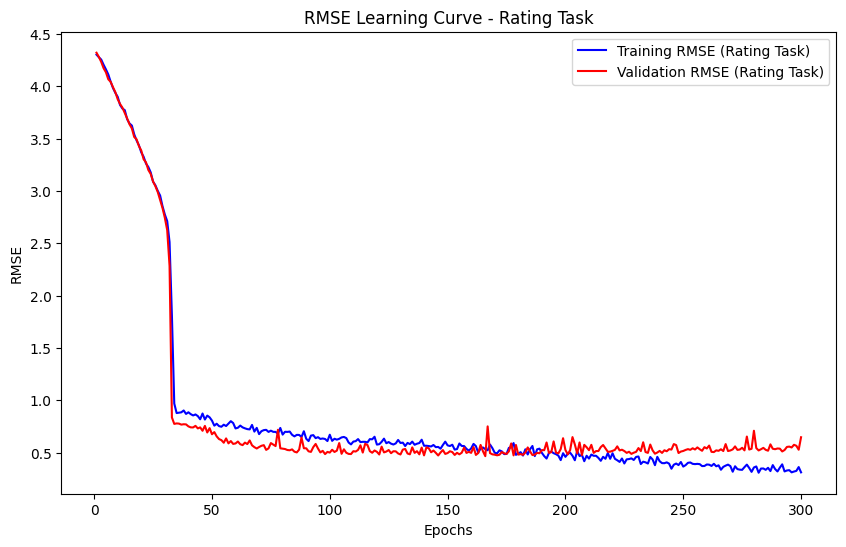

In [23]:
print(history.history.keys())

# Extract RMSE metrics from history
rating_rmse = history.history['rating_model_rating_rmse']
val_rating_rmse = history.history['val_rating_model_rating_rmse']

epochs_x = range(1, len(rating_rmse) + 1)

# Plot the RMSE learning curves for the rating task
plt.figure(figsize=(10, 6))
plt.plot(epochs_x, rating_rmse, 'b', label='Training RMSE (Rating Task)')
plt.plot(epochs_x, val_rating_rmse, 'r', label='Validation RMSE (Rating Task)')
plt.title('RMSE Learning Curve - Rating Task')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()
plt.show()

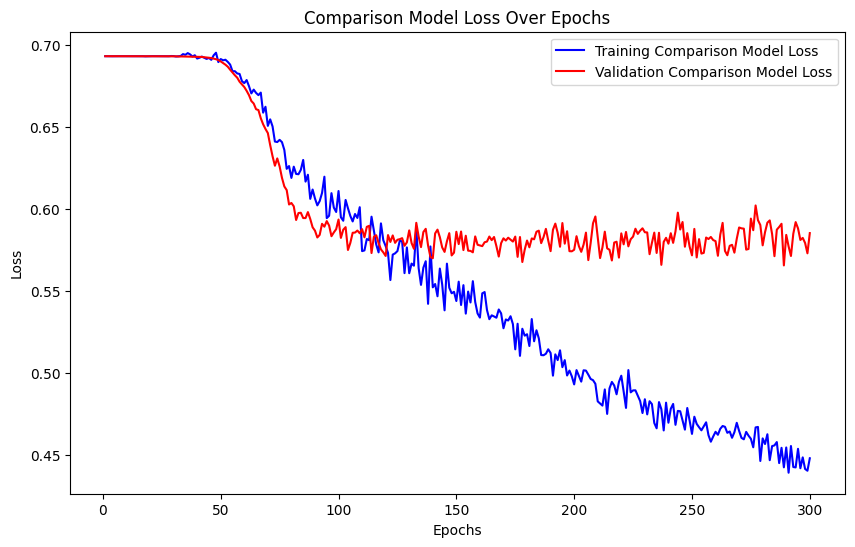

In [24]:
# Extract the comparison model loss from the history object
comparison_model_loss = history.history['comparison_model_loss']
val_comparison_model_loss = history.history['val_comparison_model_loss']

# Plot the comparison model loss over the epochs
epochs_x = range(1, len(comparison_model_loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs_x, comparison_model_loss, 'b', label='Training Comparison Model Loss')
plt.plot(epochs_x, val_comparison_model_loss, 'r', label='Validation Comparison Model Loss')
plt.title('Comparison Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Display the learning curves of the comparison task.


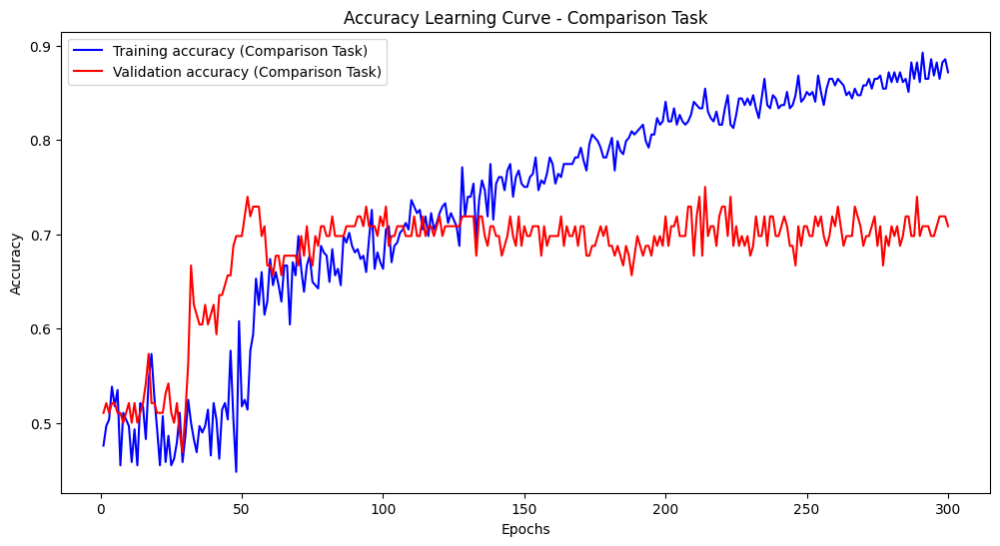

In [25]:
# Extract RMSE metrics from history
comparison_output_custom_binary_accuracy = history.history['comparison_model_custom_binary_accuracy']
val_comparison_output_custom_binary_accuracy = history.history['val_comparison_model_custom_binary_accuracy']


epochs_x = range(1, len(comparison_output_custom_binary_accuracy) + 1)

# Plot the RMSE learning curves for the comparison task
plt.figure(figsize=(12, 6))
plt.plot(epochs_x, comparison_output_custom_binary_accuracy, 'b', label='Training accuracy (Comparison Task)')
plt.plot(epochs_x, val_comparison_output_custom_binary_accuracy, 'r', label='Validation accuracy (Comparison Task)')
plt.title('Accuracy Learning Curve - Comparison Task')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Define a function that calculates Pearson correlation.


In [26]:
from scipy import stats

def pearsonr_ci(x,y,alpha=0.05):
    ''' calculate Pearson correlation along with the confidence interval using scipy and numpy
    Parameters
    ----------
    x, y : iterable object such as a list or np.array
      Input for correlation calculation
    alpha : float
      Significance level. 0.05 by default
    Returns
    -------
    r : float
      Pearson's correlation coefficient
    pval : float
      The corresponding p value
    lo, hi : float
      The lower and upper bound of confidence intervals
    '''
    N = len(x)
    r, p = stats.pearsonr(x,y)
    r_z = np.arctanh(r)
    se = 1/np.sqrt(N-3)
    z = stats.norm.ppf(1-alpha/2)
    lo_z, hi_z = r_z-z*se, r_z+z*se
    lo, hi = np.tanh((lo_z, hi_z))
    return r, p, lo, hi

Predict the scores for the images in the testing set. Display the predictions of the first 6 images.


In [27]:
# Rating Model
rating_predictions = []

X_val = X_val / 255.0
for img in X_val:
  img = img.reshape(1, 192, 256, 3)
  pred = rating_model.predict(img)
  rating_predictions.append(float(pred))

rating_predictions = np.array(rating_predictions)


1/1 [==============================] - 0s 20ms/step


/tmp/ipykernel_2592929/144748134.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rating_predictions.append(float(pred))


1/1 [==============================] - 0s 20ms/step


Display some websites of the test set and the predicted aesthetics score.


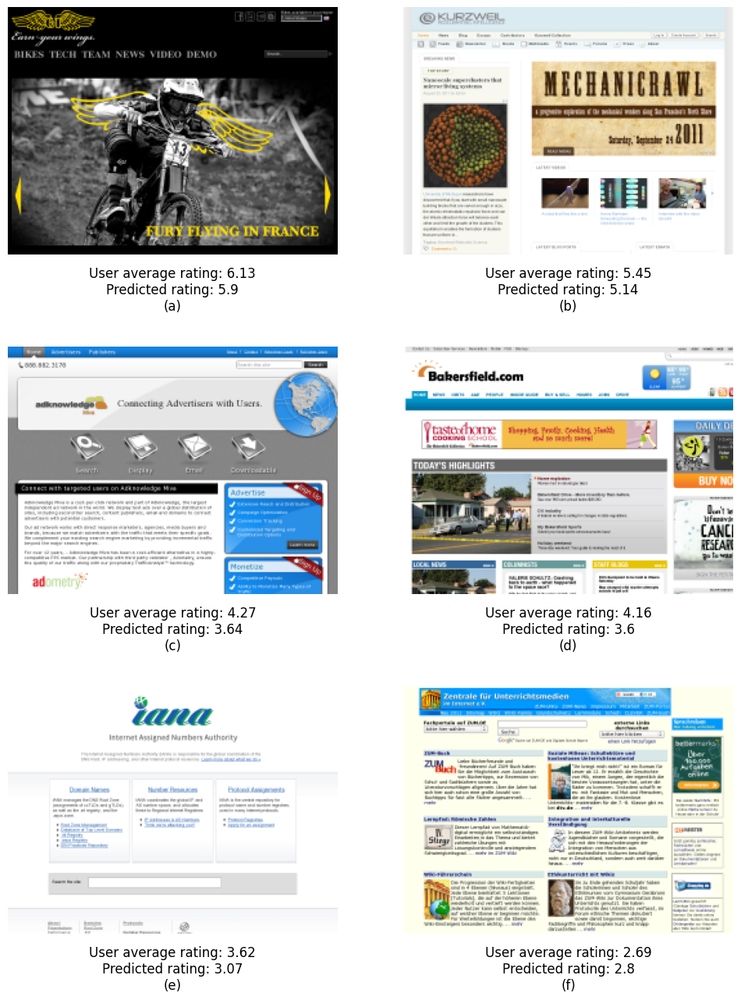

In [28]:
image_ids = [87, 45, 49, 94, 14, 83] # test image IDs sorted in descending order according to the website's aesthetics level

fig = plt.figure(figsize=(12, 16))
i = 1
for id in image_ids:
  if 'english' in test_images[id]:
    path = images_path + '/english_resized/' + test_images[id].rsplit('/', 1)[1]
  else:
    path = images_path + '/foreign_resized/' + test_images[id].rsplit('/', 1)[1]

  plt.subplot(len(image_ids)//2, 2, i)
  img = mping.imread(path)
  plt.title('User average rating: ' + str(np.round(y_val[id],2)) + '\nPredicted rating: ' + str(np.round(rating_predictions[id],2)) + '\n(' + chr(97+i-1) + ')', y=-0.25)
  plt.axis('off')
  plt.imshow(img)

  i += 1

plt.show()

Display images


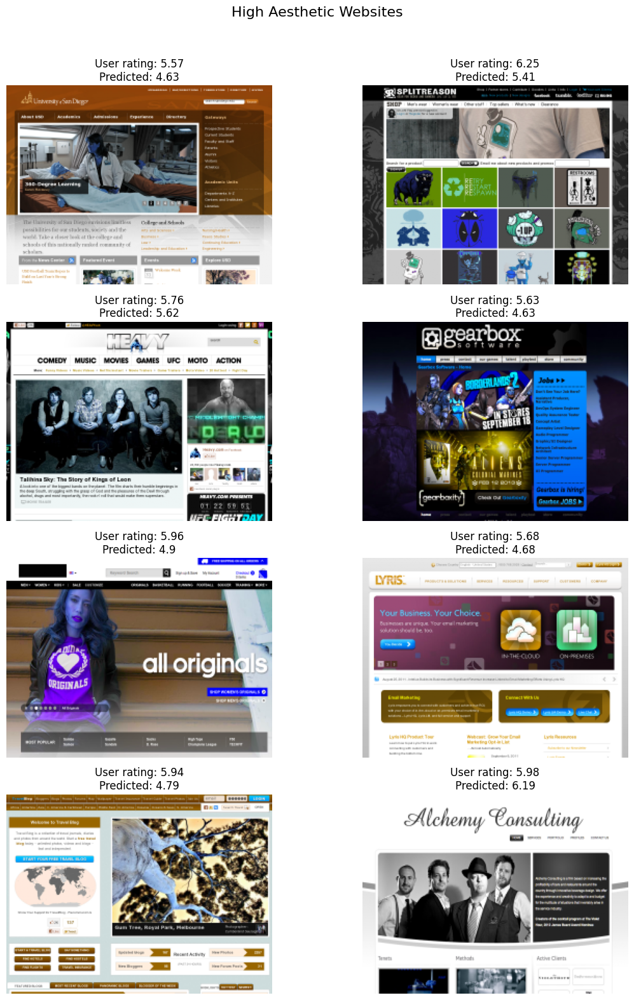

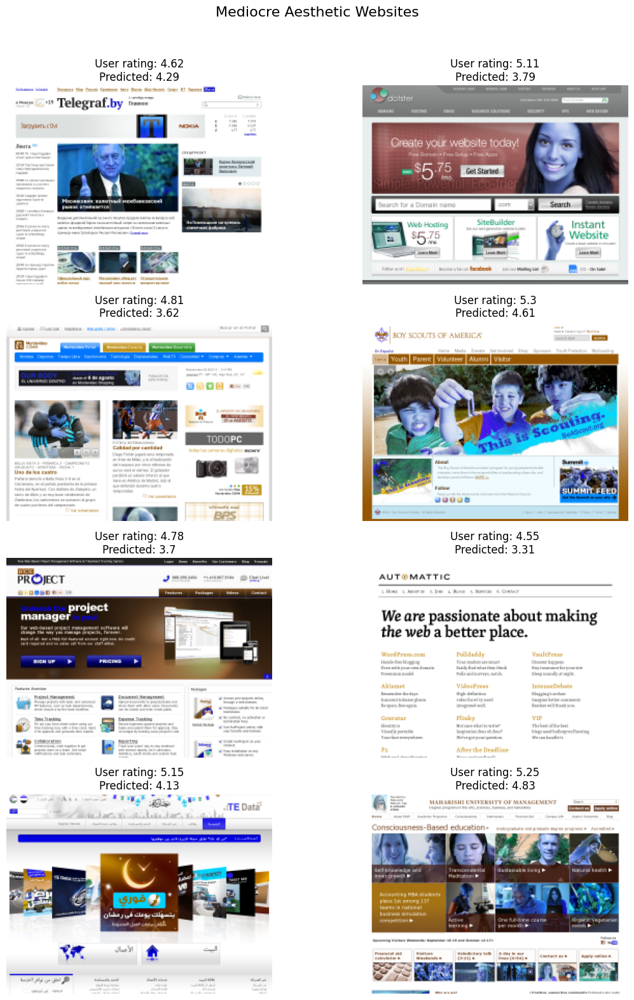

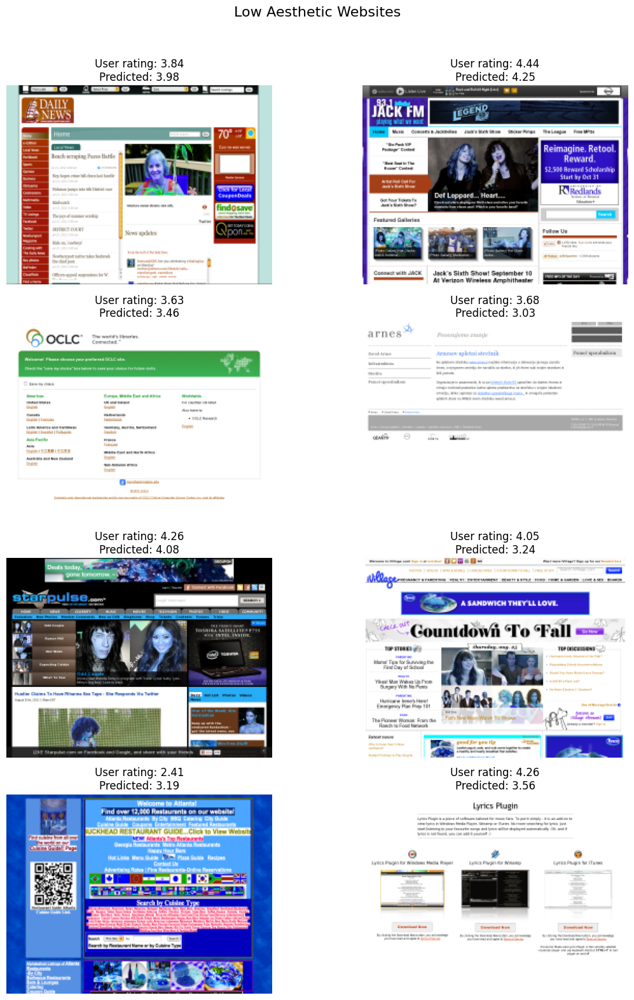

In [31]:

# Define the categories based on y_val
categories = {
    'High Aesthetic': np.where(y_val > 5.5)[0],
    'Mediocre Aesthetic': np.where((y_val >= 4.5) & (y_val <= 5.5))[0],
    'Low Aesthetic': np.where(y_val < 4.5)[0]
}

# Function to plot images in a grid
def plot_images_in_grid(indices, title):
    fig, axes = plt.subplots(4, 2, figsize=(12, 16))
    fig.suptitle(title, fontsize=16)
    
    for i, ax in enumerate(axes.flat):
        if i < len(indices):
            idx = indices[i]
            ax.imshow(X_val[idx])
            ax.axis('off')
            ax.set_title(f'User rating: {np.round(y_val[idx], 2)}\nPredicted: {np.round(rating_predictions[idx], 2)}')
        else:
            ax.axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Plot for each category
for category, indices in categories.items():
    if len(indices) >= 8:
        selected_indices = indices[:8]  # Select the first 8 images
    else:
        selected_indices = indices  # If fewer than 8, select all available
    
    plot_images_in_grid(selected_indices, f'{category} Websites')

1/1 [==============================] - 0s 85ms/step


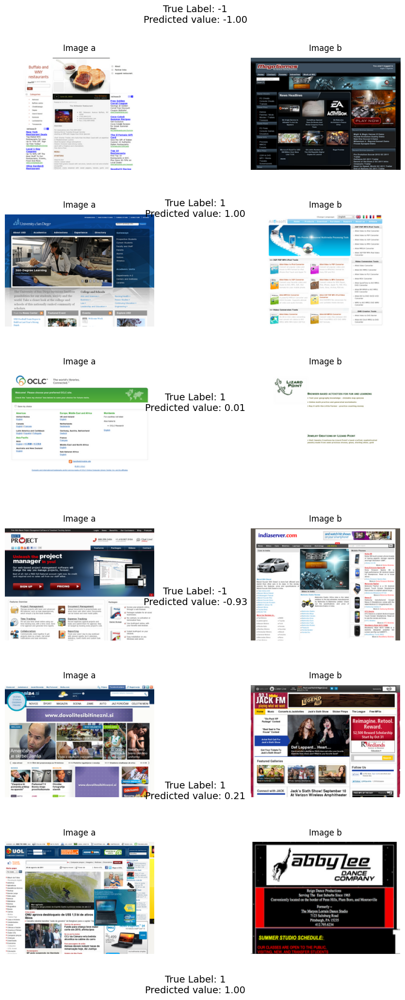

Custom Binary Accuracy: 0.658730149269104


In [32]:
# # Comparison Model

# Normalize image pairs
def normalize_image_pairs(X_pairs):
    normalized_pairs = []
    for img1, img2 in X_pairs:
        img1_normalized = img1 / 255.0
        img2_normalized = img2 / 255.0
        normalized_pairs.append((img1_normalized, img2_normalized))
    return normalized_pairs

# Normalize the validation image pairs
X_pairs_val_normalized = normalize_image_pairs(X_pairs_val)

# Predict
comparison_predictions = []
num_batches = len(X_pairs_val_normalized) // batch_size


for i in range(num_batches):
    batch_pairs = X_pairs_val_normalized[i * batch_size:(i + 1) * batch_size]
    img1_batch = np.array([pair[0] for pair in batch_pairs])
    img2_batch = np.array([pair[1] for pair in batch_pairs])
    
    # Predict
    preds = comparison_model.predict([img1_batch, img2_batch])
    comparison_predictions.extend(preds.flatten())

# Handle remaining pairs if the number of pairs is not a multiple of batch_size
if len(X_pairs_val_normalized) % batch_size != 0:
    batch_pairs = X_pairs_val_normalized[num_batches * batch_size:]
    img1_batch = np.array([pair[0] for pair in batch_pairs])
    img2_batch = np.array([pair[1] for pair in batch_pairs])
    
    # Predict
    preds = comparison_model.predict([img1_batch, img2_batch])
    comparison_predictions.extend(preds.flatten())

comparison_predictions = np.array(comparison_predictions)

# Manually select specific IDs
manual_pair_ids = [24, 56, 62, 45, 16, 87]  # Replace with desired IDs

# Plotting
fig, axes = plt.subplots(len(manual_pair_ids), 2, figsize=(12, len(manual_pair_ids) * 4))
fig.subplots_adjust(hspace=0.4)
i = 0
for idx, id in enumerate(manual_pair_ids):
    img1, img2 = X_pairs_val[id]
    
    # Plot first image of the pair
    axes[idx, 0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    axes[idx, 0].axis('off')
    axes[idx, 0].set_title('Image a', fontsize=12, pad=10)
    
    # Plot second image of the pair
    axes[idx, 1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    axes[idx, 1].axis('off')
    axes[idx, 1].set_title('Image b', fontsize=12, pad=10)
    
    # Add text with the true label and predicted value in the middle between the images
    fig.text(0.5, (len(manual_pair_ids) - idx - 0.5) / len(manual_pair_ids), 
             f'True Label: {y_pairs_val[id]}\nPredicted value: {comparison_predictions[id]:.2f}', 
             ha='center', va='center', fontsize=14)

plt.show()

# Calculate custom binary accuracy
accuracy = custom_binary_accuracy(y_pairs_val, comparison_predictions)

print(f"Custom Binary Accuracy: {accuracy.numpy()}")

Create a scatterplot to check the relationship between ground truth and predicted scores.


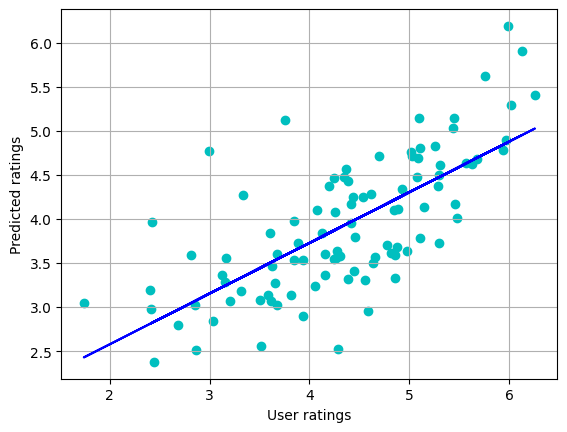

In [34]:
from numpy.polynomial.polynomial import polyfit
b, m = polyfit(y_val, rating_predictions, 1)

fig = plt.figure()
plt.scatter(y_val, rating_predictions, c='c')
plt.plot(y_val, b + m * y_val, '-', c='b')
plt.xlabel('User ratings')
plt.ylabel('Predicted ratings')

# Add grid
plt.grid(True)

plt.show()

Calculate the Pearson correlation and the RMSE between ground truth and predicted scores.


In [35]:
from sklearn.metrics import mean_squared_error
from math import sqrt

corr, p, lo, hi = pearsonr_ci(y_val, rating_predictions)
print('Pearsons correlation: r=%.4f, p=%.2e, CI=[%.2f, %.2f]' % (corr, p, lo, hi))
rmse_test = sqrt(mean_squared_error(y_val, rating_predictions))
print('RMSE: %.3f' % rmse_test)

Pearsons correlation: r=0.7096, p=2.85e-16, CI=[0.60, 0.80]
RMSE: 0.801


Plot the distribution of ground truth scores and the distribution of predictions.


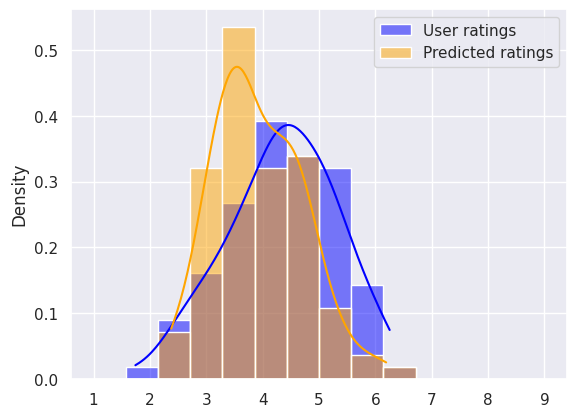

In [37]:
import seaborn as sns

fig = plt.figure()
sns.set_theme(color_codes=True)

bins = np.linspace(1, 9, num=15)

# sns.displot(y_val, bins=bins, label='User ratings', kde=True)

# sns.displot(rating_predictions, bins=bins, label='Predicted ratings', kde=True)
# Plot the distributions on the same figure
sns.histplot(y_val, bins=bins, label='User ratings', kde=True, color='blue', stat="density", alpha=0.5)
sns.histplot(rating_predictions, bins=bins, label='Predicted ratings', kde=True, color='orange', stat="density", alpha=0.5)

plt.legend()

plt.show()


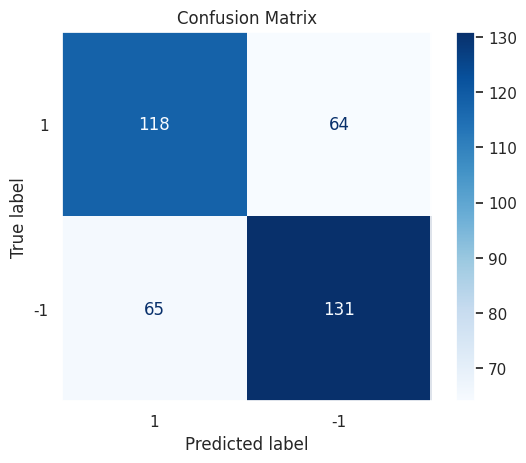

In [38]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
comparison_predictions
# Use 0.0 as the threshold for tanh output
comparison_predictions = tf.where(comparison_predictions >= 0.0, 1.0, -1.0)  # Convert predictions to 1 or -1


# Assuming y_true and y_pred are your true labels and predictions
cm = confusion_matrix(y_pairs_val, comparison_predictions, labels=[1, -1])
# Plot confusion matrix without grid lines
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[1, -1])
fig, ax = plt.subplots()
disp.plot(cmap=plt.cm.Blues, ax=ax)
ax.grid(False)  # Turn off grid lines
plt.title('Confusion Matrix')
plt.show()